# **Evaluate Reconstruction and Simulated data**
In this notebook we will evaluate the reconstruction of the original data, as well as evaluating the predicted cell-type specific perturbation response. NOTE: only monocytes are perturbed. They are typically the largest cell-type proportions, but the perturbation is still specific to this one cell-type. This is a difficult task, because it will look like a global shift if you exclude cell-type specific information.

The data we use is the Kang data. We augment this dataset by modifying the stimulated cells. We only use stimulated monocytes in order to show the specificity in which BuDDI can work. Since the ground truth stimulation provides a global shift in expression, using only one cell type as the perturbed observation shows that BuDDI can truely identify a cell-type specific perturbation.


# **Imports**

In [69]:
# import the VAE code
import sys
sys.path.insert(1, '../../')
sys.path.insert(1, '../')
from buddi import buddi
from buddi.preprocessing import sc_preprocess
from buddi.plotting import validation_plotting as vp


# general imports

import warnings
import numpy as np
import scanpy as sc
from scipy.stats import rankdata
from sklearn.metrics import average_precision_score, f1_score


# Images, plots, display, and visualization
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from sklearn.preprocessing import scale, MinMaxScaler
from matplotlib_venn import venn2
from upsetplot import from_contents, UpSet

# programming stuff
import time
import os
import pickle
from pathlib import Path

# tensorflow stuff
import tensorflow as tf
from tensorflow.keras.optimizers.legacy import Adam
from tensorflow.keras.utils import to_categorical, normalize, plot_model


# disable eager execution
# https://github.com/tensorflow/tensorflow/issues/47311#issuecomment-786116401
from tensorflow.python.framework.ops import disable_eager_execution
disable_eager_execution()


In [70]:
## parameters
sc_aug_data_path = f"{os.getcwd()}/../data/single_cell_data/augmented_sciplex_data/"
res_data_path = f"{os.getcwd()}/../results/single_cell_data/buddiM2_sciplex/"

cibersort_genes_path = (f"{os.getcwd()}/../data/single_cell_data/cibersort_sciplex/" +
                        "CIBERSORTx_Job67_test_cybersort_sig_inferred_phenoclasses" +
                        ".CIBERSORTx_Job67_test_cybersort_sig_inferred_refsample.bm.K999.txt")



num_genes = 7000

batch_size = 500

exp_id = "all-sciplex"

curr_treatment = "A549"
res_id = f"{curr_treatment}-sciplex"


# Set-up experimental variables

In [71]:

##################################################
##### set up experiment specific variables
##################################################


# number expected cell types
n_cell_types = 3

# number of patients/domains/samples expected
n_tot_samples = 1 # 

# number of drugs 
# one-hot encoded
n_drugs = 6

# number of types of sequencing (one-hot encoded)
n_tech = 2


# **Load / Pre-process data**
Import pre-processed pseudobulks

In [72]:


# read in all the data

stim_order = ['CTRL', "STIM"]
train_order = ['Train', "Test"]
cell_order = [curr_treatment]
drug_order = ["Tanespimycin (17-AAG)", "Fedratinib (SAR302503, TG101348)",
              "Trametinib (GSK1120212)", "Triamcinolone Acetonide", "Trichostatin A (TSA)"]

X_full = None
Y_full = None
meta_df = None
for curr_train in train_order:
    for curr_stim in stim_order:
        for curr_drug in drug_order:
            for curr_cell_type in cell_order:

                curr_samp = f"{curr_drug}_{curr_cell_type}"

                print(curr_samp)

                pseudobulks_df, prop_df, gene_df, sig_df, metadata_df = sc_preprocess.read_single_pseudobulk_file(sc_aug_data_path, curr_samp, curr_stim, curr_train, exp_id)
                pseudobulks_df.columns = gene_df

                if X_full is None:
                    X_full, Y_full, meta_df = pseudobulks_df, prop_df, metadata_df
                else:
                    X_full = pd.concat([X_full, pseudobulks_df])
                    Y_full = pd.concat([Y_full, prop_df])
                    meta_df = pd.concat([meta_df, metadata_df])

X_full.columns = gene_df

# the perturbation is applied in a cell type specific manner
meta_df['perturbation'] = meta_df['perturbation'] + '_' + meta_df['cell_type_perturbed']
meta_df['perturbation'].iloc[np.where(meta_df.stim == "CTRL")] = "control"
meta_df["sample_id"] = "samp1"

# for the bulks, only keep the samples with
# the perturbed cell type as the majority
# or less than 20%

Y_max = np.copy(Y_full)
Y_max = np.argmax(Y_max, axis=1)
Y_max = Y_full.columns[Y_max]
meta_df["Y_max"] = Y_max

#idx_sc = np.where(meta_df.samp_type != "bulk")[0]
#idx_bulk_pert = np.where((meta_df.samp_type == "bulk") & (meta_df.Y_max == curr_treatment))[0]
#idx_keep = np.union1d(idx_sc, idx_bulk_pert)

#X_full = X_full.iloc[idx_keep]
#Y_full = Y_full.iloc[idx_keep]
#meta_df = meta_df.iloc[idx_keep]

Tanespimycin (17-AAG)_A549
Fedratinib (SAR302503, TG101348)_A549
Trametinib (GSK1120212)_A549
Triamcinolone Acetonide_A549
Trichostatin A (TSA)_A549
Tanespimycin (17-AAG)_A549
Fedratinib (SAR302503, TG101348)_A549


Trametinib (GSK1120212)_A549
Triamcinolone Acetonide_A549
Trichostatin A (TSA)_A549
Tanespimycin (17-AAG)_A549
Fedratinib (SAR302503, TG101348)_A549
Trametinib (GSK1120212)_A549
Triamcinolone Acetonide_A549
Trichostatin A (TSA)_A549
Tanespimycin (17-AAG)_A549
Fedratinib (SAR302503, TG101348)_A549
Trametinib (GSK1120212)_A549
Triamcinolone Acetonide_A549
Trichostatin A (TSA)_A549


# Define indices and set-up metadata

In [73]:

##################################################
#####. Design the experiment
##################################################


X_orig = np.copy(X_full)

# set up the metadata arrays and indices
samp_label = np.asarray(meta_df.sample_id)
index_label, numeric_label = np.unique(samp_label, return_inverse=True)
Label_full = numeric_label
label_full = to_categorical(numeric_label)

samp_drug = np.asarray(meta_df.perturbation)
index_drug, numeric_drug = np.unique(samp_drug, return_inverse=True)
Drug_full = numeric_drug
drug_full = to_categorical(numeric_drug)

samp_bulk = np.asarray(meta_df.samp_type)
index_bulk, numeric_bulk = np.unique(samp_bulk, return_inverse=True)
Bulk_full = numeric_bulk
bulk_full = to_categorical(numeric_bulk)


idx_train = np.where(meta_df.isTraining=="Train")[0] 
idx_test = np.where(meta_df.isTraining!="Train")[0] 
idx_bulk = np.where(meta_df.samp_type == "bulk")[0]
idx_sc = np.where(meta_df.samp_type != "bulk")[0]
idx_drug = np.where(meta_df.stim != "CTRL")[0]
idx_random = np.where(meta_df.cell_prop_type == "random")[0]

Y_max = np.copy(Y_full)
Y_max = np.argmax(Y_max, axis=1)
Y_max = Y_full.columns[Y_max]
meta_df["Y_max"] = Y_max

# now seperate out the training and testing data
X_train_df = X_full.iloc[idx_train]
Y_train_df = Y_full.iloc[idx_train]


# try using the cibersort genes
cibersort_df = pd.read_csv(cibersort_genes_path, sep="\t" )
cibersort_genes = cibersort_df["NAME"].values.tolist()

# only keep cibersort genes that are in common genes
cibersort_genes = np.intersect1d(gene_df, cibersort_genes)

# convert to data matrices
X_train = X_train_df.to_numpy()
Y_train = Y_train_df.to_numpy()


## get the top variable genes
X_colmean = X_train.mean(axis=0)
X_colvar = X_train.var(axis=0)
X_CoV = np.array(np.divide(X_colvar, X_colmean+0.001))

# need to get the genes such that
# the union of the highly variable and the
# CIBERSORTx genes are 7000 total
num_genes_found = False
initial_count = 7000
while not num_genes_found:
    idx_top = np.argpartition(X_CoV, -initial_count)[-initial_count:]
    top_gene_df = gene_df.iloc[idx_top]
    CoV_only = np.union1d(top_gene_df, cibersort_genes)
    if len(CoV_only) == 7000:
        num_genes_found = True
    else:
        initial_count = initial_count -1

idx_top = np.argpartition(X_CoV, -initial_count)[-initial_count:] 
gene_df = gene_df.iloc[idx_top]



# compare our variable genes with cibersort defined genes

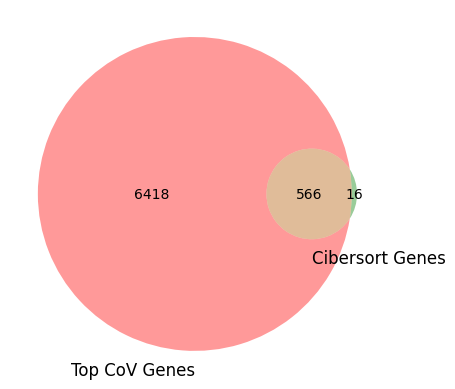

In [74]:

venn2([set(gene_df), set(cibersort_genes)], set_labels = ('Top CoV Genes', 'Cibersort Genes'))
plt.show()

In [75]:
union_genes = np.union1d(gene_df, cibersort_genes)
len(union_genes)

7000

In [76]:
union_genes = np.union1d(gene_df, cibersort_genes)


# Normalize Data

In [77]:
meta_df

,sample_id,stim,isTraining,cell_prop_type,samp_type,perturbation,cell_type_perturbed,Y_max
0,samp1,CTRL,Train,random,bulk,control,A549,A549
1,samp1,CTRL,Train,random,bulk,control,A549,A549
2,samp1,CTRL,Train,random,bulk,control,A549,MCF7
3,samp1,CTRL,Train,random,bulk,control,A549,K562
4,samp1,CTRL,Train,random,bulk,control,A549,A549
...,...,...,...,...,...,...,...,...
2495,samp1,STIM,Test,cell_type_specific,sc_ref,Trichostatin A (TSA)_A549,A549,MCF7
2496,samp1,STIM,Test,cell_type_specific,sc_ref,Trichostatin A (TSA)_A549,A549,MCF7
2497,samp1,STIM,Test,cell_type_specific,sc_ref,Trichostatin A (TSA)_A549,A549,MCF7
2498,samp1,STIM,Test,cell_type_specific,sc_ref,Trichostatin A (TSA)_A549,A549,MCF7


In [78]:
X_full = X_full.loc[:,union_genes]
X_full

gene_ids,AAAS,AACS,AAED1,AAGAB,AAMDC,AAMP,AARS,AASDH,AATF,ABAT,...,ZSWIM7,ZSWIM8,ZUFSP,ZWILCH,ZXDC,ZYG11A,ZYG11B,ZYX,ZZEF1,ZZZ3
0,281.0,386.0,174.0,1023.0,242.0,184.0,1460.0,190.0,1470.0,445.0,...,603.0,259.0,101.0,528.0,727.0,468.0,808.0,314.0,1239.0,1449.0
0,271.0,327.0,192.0,949.0,172.0,151.0,1327.0,209.0,1507.0,137.0,...,620.0,209.0,97.0,454.0,567.0,280.0,695.0,239.0,1158.0,1077.0
0,294.0,550.0,136.0,1180.0,358.0,238.0,1738.0,237.0,1201.0,1243.0,...,521.0,407.0,139.0,554.0,1101.0,630.0,1050.0,403.0,1349.0,1905.0
0,196.0,264.0,89.0,826.0,253.0,112.0,1601.0,204.0,1060.0,75.0,...,259.0,319.0,168.0,393.0,499.0,877.0,933.0,434.0,728.0,1476.0
0,193.0,313.0,127.0,963.0,229.0,142.0,1508.0,189.0,1296.0,110.0,...,440.0,316.0,116.0,431.0,565.0,613.0,827.0,318.0,909.0,1263.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,418.0,1056.0,222.0,1630.0,451.0,395.0,2095.0,341.0,1143.0,3031.0,...,646.0,686.0,275.0,803.0,1960.0,618.0,1330.0,525.0,2147.0,3085.0
0,435.0,1031.0,239.0,1770.0,487.0,398.0,2128.0,336.0,1188.0,3216.0,...,637.0,724.0,317.0,808.0,2045.0,628.0,1359.0,544.0,2223.0,3113.0
0,398.0,1151.0,239.0,1653.0,455.0,399.0,2085.0,358.0,1141.0,3205.0,...,672.0,676.0,283.0,794.0,2012.0,660.0,1308.0,541.0,2096.0,3063.0
0,384.0,1105.0,209.0,1647.0,481.0,380.0,2074.0,334.0,1190.0,3231.0,...,630.0,696.0,298.0,752.0,2056.0,630.0,1353.0,545.0,2043.0,3077.0


In [79]:
X_full = X_full.loc[:,union_genes]

## normalize within sample
clip_upper = np.quantile(X_full, 0.9)
X_full = np.clip(X_full, 0, clip_upper)
scaler = MinMaxScaler()
scaler.fit(X_full)

# now normalize with the scaler trained on the 
# training data
X_full = np.clip(X_full, 0, clip_upper)
X_full = scaler.transform(X_full)


# for unknown proportions; 
# this is bulks used in training
idx_bulk_train = np.intersect1d(idx_bulk, idx_train) 
X_unkp = X_full[idx_bulk_train,]
label_unkp = label_full[idx_bulk_train,]
drug_unkp = drug_full[idx_bulk_train,]
bulk_unkp = bulk_full[idx_bulk_train,]
y_unkp = Y_full.iloc[idx_bulk_train]
y_unkp = y_unkp.to_numpy()

# for known proportions
idx_sc_train = np.intersect1d(idx_sc, idx_train) 
X_kp = X_full[idx_sc_train,]
label_kp = label_full[idx_sc_train,]
drug_kp = drug_full[idx_sc_train,]
bulk_kp = bulk_full[idx_sc_train,]
y_kp = Y_full.iloc[idx_sc_train]
y_kp = y_kp.to_numpy()


In [80]:
tab = meta_df.groupby(['cell_prop_type', 'isTraining']).size()
tab.unstack()

isTraining,Test,Train
cell_prop_type,,
cell_type_specific,15000,7500
random,10000,7500


In [81]:
tab = meta_df.groupby(['stim', 'isTraining']).size()
tab.unstack()

isTraining,Test,Train
stim,,
CTRL,12500,12500
STIM,12500,2500


# Plot all data

[t-SNE] Computing 61 nearest neighbors...


[t-SNE] Indexed 40000 samples in 0.612s...
[t-SNE] Computed neighbors for 40000 samples in 29.451s...
[t-SNE] Computed conditional probabilities for sample 1000 / 40000
[t-SNE] Computed conditional probabilities for sample 2000 / 40000
[t-SNE] Computed conditional probabilities for sample 3000 / 40000
[t-SNE] Computed conditional probabilities for sample 4000 / 40000
[t-SNE] Computed conditional probabilities for sample 5000 / 40000
[t-SNE] Computed conditional probabilities for sample 6000 / 40000
[t-SNE] Computed conditional probabilities for sample 7000 / 40000
[t-SNE] Computed conditional probabilities for sample 8000 / 40000
[t-SNE] Computed conditional probabilities for sample 9000 / 40000
[t-SNE] Computed conditional probabilities for sample 10000 / 40000
[t-SNE] Computed conditional probabilities for sample 11000 / 40000
[t-SNE] Computed conditional probabilities for sample 12000 / 40000
[t-SNE] Computed conditional probabilities for sample 13000 / 40000
[t-SNE] Computed condit

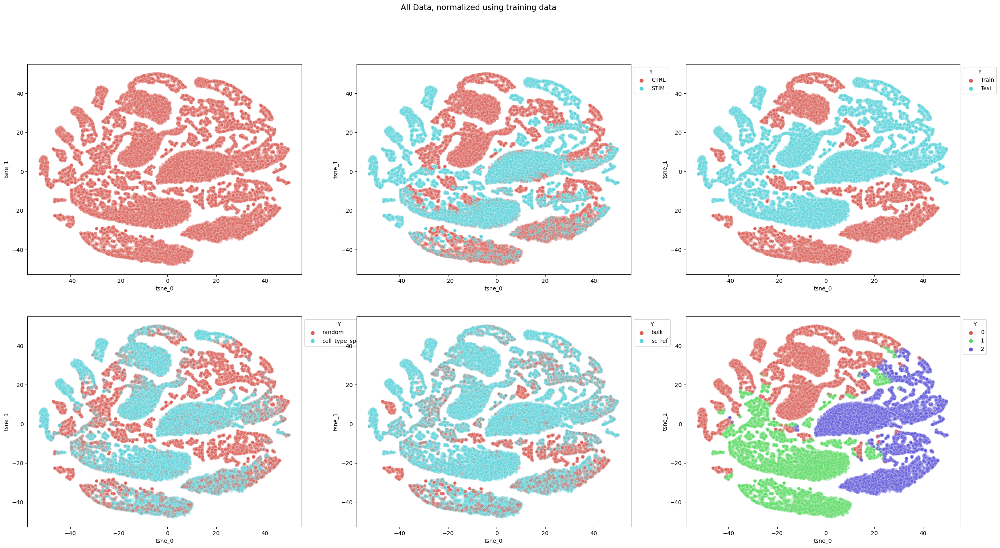

In [82]:
## plot samples
plot_df = vp.get_tsne_for_plotting(X_full)

fig, axs = plt.subplots(2, 3, figsize=(30,15))

Y_temp = np.copy(Y_full)
Y_temp = np.argmax(Y_temp, axis=1) 

vp.plot_tsne(plot_df, meta_df.sample_id.to_numpy(), axs[0,0], title=f"")
vp.plot_tsne(plot_df, meta_df.stim.to_numpy(), axs[0,1], title=f"")
vp.plot_tsne(plot_df, meta_df.isTraining.to_numpy(), axs[0,2], title=f"")
vp.plot_tsne(plot_df, meta_df.cell_prop_type.to_numpy(), axs[1,0], title=f"")
vp.plot_tsne(plot_df, meta_df.samp_type.to_numpy(), axs[1,1], title=f"")
vp.plot_tsne(plot_df, Y_temp, axs[1,2], title=f"")


fig.suptitle("All Data, normalized using training data", fontsize=14)

axs[0,0].legend([],[], frameon=False)

fig.show()


(5000, 2)
(5000, 2)


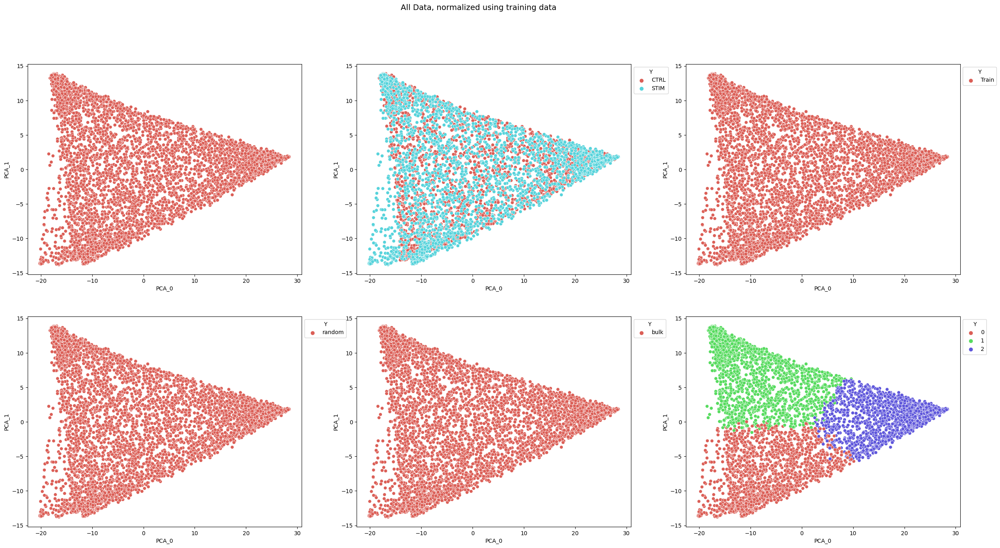

In [83]:
## plot samples
idx_interest = np.where(np.logical_and(meta_df.samp_type == "bulk", meta_df.isTraining == "Train"))[0]

plot_df = vp.get_pca_for_plotting(X_full[idx_interest])

fig, axs = plt.subplots(2, 3, figsize=(30,15))

Y_temp = np.copy(Y_full.iloc[idx_interest])
Y_temp = np.argmax(Y_temp, axis=1) 

vp.plot_pca(plot_df, meta_df.sample_id.to_numpy()[idx_interest], axs[0,0], title=f"", alpha=1)
vp.plot_pca(plot_df, meta_df.stim.to_numpy()[idx_interest], axs[0,1], title=f"", alpha=1)
vp.plot_pca(plot_df, meta_df.isTraining.to_numpy()[idx_interest], axs[0,2], title=f"", alpha=1)
vp.plot_pca(plot_df, meta_df.cell_prop_type.to_numpy()[idx_interest], axs[1,0], title=f"", alpha=1)
vp.plot_pca(plot_df, meta_df.samp_type.to_numpy()[idx_interest], axs[1,1], title=f"", alpha=1)
vp.plot_pca(plot_df, Y_temp, axs[1,2], title=f"", alpha=1)


fig.suptitle("All Data, normalized using training data", fontsize=14)

axs[0,0].legend([],[], frameon=False)

fig.show()


[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 5000 samples in 0.007s...
[t-SNE] Computed neighbors for 5000 samples in 0.604s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5000
[t-SNE] Computed conditional probabilities for sample 2000 / 5000
[t-SNE] Computed conditional probabilities for sample 3000 / 5000
[t-SNE] Computed conditional probabilities for sample 4000 / 5000
[t-SNE] Computed conditional probabilities for sample 5000 / 5000
[t-SNE] Mean sigma: 0.921230


[t-SNE] KL divergence after 250 iterations with early exaggeration: 68.593872
[t-SNE] KL divergence after 500 iterations: 1.031811
(5000, 2)
(5000, 2)


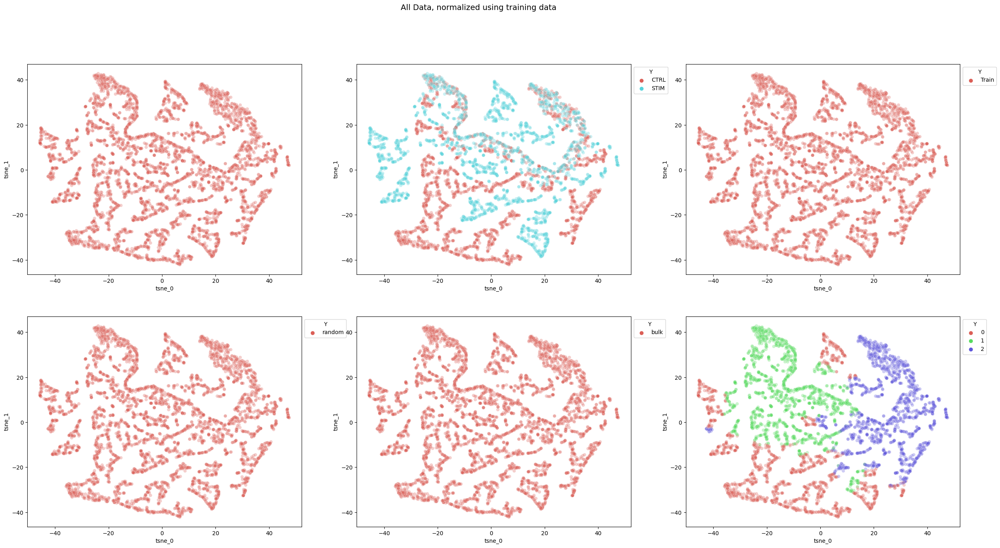

In [84]:
## plot samples
idx_interest = np.where(np.logical_and(meta_df.samp_type == "bulk", meta_df.isTraining == "Train"))[0]

plot_df = vp.get_tsne_for_plotting(X_full[idx_interest])

fig, axs = plt.subplots(2, 3, figsize=(30,15))

Y_temp = np.copy(Y_full.iloc[idx_interest])
Y_temp = np.argmax(Y_temp, axis=1) 

vp.plot_tsne(plot_df, meta_df.sample_id.to_numpy()[idx_interest], axs[0,0], title=f"")
vp.plot_tsne(plot_df, meta_df.stim.to_numpy()[idx_interest], axs[0,1], title=f"")
vp.plot_tsne(plot_df, meta_df.isTraining.to_numpy()[idx_interest], axs[0,2], title=f"")
vp.plot_tsne(plot_df, meta_df.cell_prop_type.to_numpy()[idx_interest], axs[1,0], title=f"")
vp.plot_tsne(plot_df, meta_df.samp_type.to_numpy()[idx_interest], axs[1,1], title=f"")
vp.plot_tsne(plot_df, Y_temp, axs[1,2], title=f"")


fig.suptitle("All Data, normalized using training data", fontsize=14)

axs[0,0].legend([],[], frameon=False)

fig.show()


# **Read in trained models**

Read in the models we trained in `kang_hyp_search.ipynb`

In [85]:

res1_enc_unlab = tf.keras.models.load_model(f"{res_data_path}/model1_{res_id}_encoder_unlab")
res1_enc_lab = tf.keras.models.load_model(f"{res_data_path}/model1_{res_id}_encoder_lab")
res1_dec = tf.keras.models.load_model(f"{res_data_path}/model1_{res_id}_decoder")
res1_classifier = tf.keras.models.load_model(f"{res_data_path}/model1_{res_id}_classifier")


res2_enc_unlab = tf.keras.models.load_model(f"{res_data_path}/model2_{res_id}_encoder_unlab")
res2_enc_lab = tf.keras.models.load_model(f"{res_data_path}/model2_{res_id}_encoder_lab")
res2_dec = tf.keras.models.load_model(f"{res_data_path}/model2_{res_id}_decoder")
res2_classifier = tf.keras.models.load_model(f"{res_data_path}/model2_{res_id}_classifier")


res3_enc_unlab = tf.keras.models.load_model(f"{res_data_path}/model3_{res_id}_encoder_unlab")
res3_enc_lab = tf.keras.models.load_model(f"{res_data_path}/model3_{res_id}_encoder_lab")
res3_dec = tf.keras.models.load_model(f"{res_data_path}/model3_{res_id}_decoder")
res3_classifier = tf.keras.models.load_model(f"{res_data_path}/model3_{res_id}_classifier")

2024-09-13 15:06:20.454995: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_365' id:5898 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_365}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](kernel_180, Identity_365)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-09-13 15:06:21.499047: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_388' id:6279 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_388}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](bias_192, Identity_388)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-09-13 15:06:22.171382: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_398' id:6445 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_398}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](bias_199, Identity_398)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-09-13 15:06:22.861922: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_404' id:6534 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_404}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](bias_202, Identity_404)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-09-13 15:06:23.976896: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_410' id:6801 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_410}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](bias_213, Identity_410)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-09-13 15:06:25.114754: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_449' id:7214 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_449}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](kernel_222, Identity_449)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-09-13 15:06:25.857409: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_455' id:7372 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_455}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](kernel_227, Identity_455)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-09-13 15:06:26.612698: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_463' id:7465 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_463}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](kernel_231, Identity_463)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-09-13 15:06:27.825423: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_472' id:7738 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_472}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](bias_234, Identity_472)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-09-13 15:06:29.074654: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_508' id:8145 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_508}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](bias_252, Identity_508)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-09-13 15:06:29.909325: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_512' id:8299 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_512}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](bias_256, Identity_512)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-09-13 15:06:30.884284: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_520' id:8392 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_520}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](bias_260, Identity_520)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


# **Inspect the output**

## Plot Reconstruction

In [86]:
# subset the data to the bulk data with realistic cell-type proportions
recon_idx = np.where(np.logical_and(meta_df.cell_prop_type == "cell_type_specific", meta_df.isTraining == "Test"))[0]
recon_idx = np.where(recon_idx)[0]
recon_idx = np.random.choice(recon_idx, 5000, replace=True)

X_temp = np.copy(X_full[recon_idx])

Y_temp = np.copy(Y_full.iloc[recon_idx])
Y_temp = np.argmax(Y_temp, axis=1)
Y_temp = Y_full.columns[Y_temp]


label_temp = np.copy(Label_full[recon_idx])
label_temp = index_label[label_temp]

perturb_temp = Drug_full[recon_idx]

# get estimated proportions
prop_outputs = res1_classifier.predict(X_temp, batch_size=batch_size)

# now use the encoder to get the latent spaces
z_slack, mu_slack, _, z_rot, mu_rot, _, z_drug, mu_drug, _, z_bulk, mu_bulk, _ = res1_enc_unlab.predict(X_temp, batch_size=batch_size)

# now concatenate together
z_concat = np.hstack([z_slack, prop_outputs, z_rot, z_drug, z_bulk])

# and decode
decoded_outputs = res1_dec.predict(z_concat, batch_size=batch_size)



/home/natalie/projects/checkouts/buddi_atac/.venv/lib/python3.10/site-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2024-09-13 15:06:31.551490: W tensorflow/c/c_api.cc:304] Operation '{name:'cls_out_6/Softmax' id:6551 op device:{requested: '', assigned: ''} def:{{{node cls_out_6/Softmax}} = Softmax[T=DT_FLOAT, _has_manual_control_dependencies=true](cls_out_6/BiasAdd)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-09-13 15:06:32.044619: W tensorflow/c/c_api.cc:304] Operation '{name:'tf_op_layer_z_samp_slack_16/add/z_samp_slack_16/add' id:5983 op device:{requested: '', assigned: ''} def:{{{node tf_op_layer_z_samp_slack_16/add/z_

(10000, 2)
(10000, 2)


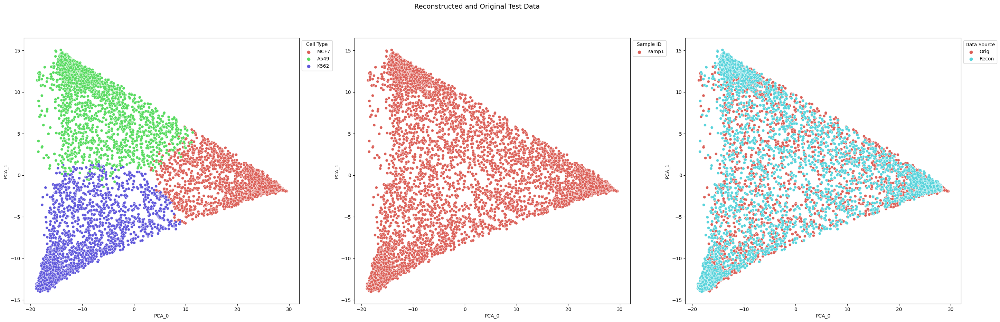

In [87]:
# make duplicated to compare
X_dup = np.vstack([X_temp, decoded_outputs])


Y_dup = np.append(Y_temp, Y_temp)

label_dup = np.append(label_temp, label_temp)
perturb_dup = np.append(perturb_temp, perturb_temp)
source_dup = np.asarray(np.append([0]*5000, [1]*5000))

source_dup_str = ["Recon" if x  else "Orig" for x in source_dup ]


fig, axs = plt.subplots(1, 3, figsize=(35,10))

plot_df = vp.get_pca_for_plotting(np.asarray(X_dup))
vp.plot_pca(plot_df, color_vec=Y_dup, ax=axs[0], title="", alpha=1, legend_title="Cell Type")
vp.plot_pca(plot_df, color_vec=label_dup, ax=axs[1], title="", alpha=1, legend_title="Sample ID")
vp.plot_pca(plot_df, color_vec=source_dup_str, ax=axs[2], title="", alpha=1, legend_title="Data Source")


fig.suptitle("Reconstructed and Original Test Data", fontsize=14)

fig.show()

## Do latent space projections of non-perturbed cell types

We want to show that the log2FC of the non-perturbed cell types is very low 

In [88]:
curr_drug

'Trichostatin A (TSA)'

In [89]:

def calc_buddi_perturbation_sample_specific(meta_df, X_full, Y_full, sample_interest, scaler, 
                            encoder_unlab, decoder, batch_size, 
                            genes_ordered, top_lim=100, use_buddi4=True):

    """
    Estimate sample-specific perturbation response for BuDDI

    meta_df: pandas dataframe of the metadata associated with X_full and Y_full
    X_full: Normalized gene expression, assumed in the same order as expected by BuDDI
    Y_full: Cell type proportions
    sample_interest: that sample ID to perturb
    encoder_unlab: BuDDI unsupervised encoder
    decoder: BuDDI decoder
    batch_size: batch size
    genes_ordered: the gene IDs matching the genes in X_full, which should also be in the same order as BuDDI
    top_lim: how many genes to report as top perturbed
    use_buddi4: Whether BuDDI has 3 or 4 latent spaces

    """


    tot_simulated_sample = Y_full.shape[1]*len(sample_interest)*100

    X_temp = np.copy(X_full)

    #####
    # get cell type latent codes
    #####
    # the codes for cell type proportion
    # and tile to repeat for each sample
    sc_props = sc_preprocess.get_single_celltype_prop_matrix(num_samp=100, cell_order=Y_full.columns)
    sc_props = np.tile(sc_props, (len(sample_interest),1))


    #####
    # get perturbation latent codes
    #####

    # get the index to get the perturbation latent codes
    pert_code_idx = np.logical_and(meta_df.isTraining == "Train", meta_df.stim == "STIM")
    pert_code_idx = np.where(pert_code_idx)[0] 
    pert_code_idx = np.random.choice(pert_code_idx, tot_simulated_sample, replace=True)

    if use_buddi4:
        z_slack, _, _, z_rot, _, _, z_pert, _, _, z_bulk, _, _ = encoder_unlab.predict(X_temp[pert_code_idx,], batch_size=batch_size)
    else:
        z_slack, _, _, z_rot, _, _, z_pert, _, _ = encoder_unlab.predict(X_temp[pert_code_idx,], batch_size=batch_size)

    # get the index to get the UNperturbed latent codes
    unpert_code_idx = np.logical_and(meta_df.isTraining == "Train", meta_df.stim == "CTRL")
    unpert_code_idx = np.where(unpert_code_idx)[0] 
    unpert_code_idx = np.random.choice(unpert_code_idx, tot_simulated_sample, replace=True)
    if use_buddi4:
        _, _, _, _, _, _, z_unpert, _, _, _, _, _ = encoder_unlab.predict(X_temp[unpert_code_idx,], batch_size=batch_size)
    else:
        _, _, _, _, _, _, z_unpert, _, _ = encoder_unlab.predict(X_temp[unpert_code_idx,], batch_size=batch_size)

    #####
    # get sample latent codes
    #####
    # get the index to get the sample latent codes
    sample_code_idx = np.logical_and(meta_df.isTraining == "Train", 
                                        np.isin(meta_df.sample_id, sample_interest))
    sample_code_idx = np.logical_and(sample_code_idx, meta_df.stim == "CTRL")
    sample_code_idx = np.where(sample_code_idx)[0] 
    sample_code_idx = np.random.choice(sample_code_idx, tot_simulated_sample, replace=True)

    if use_buddi4:
        _, _, _, z_samples, _, _, _, _, _, _, _, _ = encoder_unlab.predict(X_temp[sample_code_idx,], batch_size=batch_size)
    else:
        _, _, _, z_samples, _, _, _, _, _ = encoder_unlab.predict(X_temp[sample_code_idx,], batch_size=batch_size)

    # make the metadata table 
    temp_meta_df = meta_df.iloc[sample_code_idx]
    temp_meta_df.isTraining = "Test"
    temp_meta_df.cell_prop_type = "cell_type_specific"

    prop_max = np.copy(sc_props)
    prop_max = np.argmax(prop_max, axis=1)
    prop_max = Y_full.columns[prop_max]
    temp_meta_df.Y_max = prop_max


    ######
    # now put it all together
    ######

    # now concatenate together and add the stim codes to the latent
    if use_buddi4:
        z_concat_perturb = np.hstack([z_slack, sc_props, z_samples, z_pert, z_bulk])
    else:
        z_concat_perturb = np.hstack([z_slack, sc_props, z_samples, z_bulk])
    decoded_0_1 = decoder.predict(z_concat_perturb, batch_size=batch_size)
    decoded_0_1 = scaler.inverse_transform(decoded_0_1)

    # now concatenate together and add the stim codes to the latent
    if use_buddi4:
        z_concat_unperturb = np.hstack([z_slack, sc_props, z_samples, z_unpert, z_bulk])
    else:
        z_concat_unperturb = np.hstack([z_slack, sc_props, z_samples, z_bulk])

    decoded_0_0 = decoder.predict(z_concat_unperturb, batch_size=batch_size)
    decoded_0_0 = scaler.inverse_transform(decoded_0_0)

    ######
    # now get the differential genes
    ######


    top_genes = {}
    de_genes_all = None
    for curr_cell_type in Y_full.columns:


        # this is for the "projected" expression
        curr_idx = np.where(temp_meta_df.Y_max == curr_cell_type)[0]
        proj_ctrl = decoded_0_0[curr_idx]
        proj_stim = decoded_0_1[curr_idx]

        # take the median for normalization

        proj_ctrl = np.median(rankdata(proj_ctrl, axis=1), axis=0)
        proj_stim = np.median(rankdata(proj_stim, axis=1), axis=0)
        proj_log2FC = np.abs(proj_stim-proj_ctrl)

        # make into DF
        proj_log2FC_df = pd.DataFrame(proj_log2FC, index=genes_ordered)

        intersect_proj = proj_log2FC_df.loc[genes_ordered][0]
        top_proj_genes = intersect_proj.index[np.argsort(np.abs(intersect_proj))].tolist()[::-1][0:top_lim]

        top_genes[curr_cell_type] = top_proj_genes



    return (temp_meta_df, decoded_0_0, decoded_0_1, top_genes)



In [90]:
from scipy.stats import ttest_ind
import math

def get_nonperturbed_log2fc(curr_cell_type_perturbed,
                            meta_df, X_full, Y_full,
                            res_enc_unlab, res_dec, union_genes, scaler):
    
    curr_samp = "samp1"

    ct_perturbed_idx = np.where(meta_df["cell_type_perturbed"] == curr_cell_type_perturbed)[0]

    all_perts = meta_df.iloc[ct_perturbed_idx].perturbation.unique()
    all_perts = np.setdiff1d(all_perts, "control")

    all_Ymax = np.setdiff1d(meta_df.Y_max.unique(), curr_cell_type_perturbed)

    curr_cell_type = curr_cell_type_perturbed

    res_df = None
    log2fc_df = None
    for curr_drug in all_perts:
        for curr_Ymax in all_Ymax:

            print(f"{curr_drug} {curr_Ymax} {curr_cell_type_perturbed}")

            drug_idx = np.where((meta_df["perturbation"] == curr_drug) | (meta_df["perturbation"] == "control"))[0]
            #ct_idx = np.where(meta_df["Y_max"] == curr_cell_type_perturbed)[0]

            curr_idx = np.intersect1d(drug_idx, ct_perturbed_idx)
            #curr_idx = np.intersect1d(curr_idx, ct_idx)


            #res1_meta_df, res1_decoded_0_0, res1_decoded_0_1, res1_top_genes = buddi.calc_buddi_perturbation(
            #                                                                    meta_df.iloc[curr_idx], X_full[curr_idx], Y_full.iloc[curr_idx], 
            #                                                                    scaler, 
            #                                                                    res2_enc_unlab, res2_dec, batch_size=500, 
            #                                                                    genes_ordered=union_genes, 
            #                                                                    top_lim=100, use_buddi4=True)

            res1_meta_df, res1_decoded_0_0, res1_decoded_0_1, res1_top_genes = calc_buddi_perturbation_sample_specific(
                                                                                    meta_df.iloc[curr_idx], X_full[curr_idx], Y_full.iloc[curr_idx], 
                                                                                    "samp1", scaler, 
                                                                                    res_enc_unlab, res_dec, batch_size=500, 
                                                                                    genes_ordered=union_genes, top_lim=100, use_buddi4=True)


            real_stim, real_ctrl, proj_stim, proj_ctrl = vp.subset_sample_celltype_perturbation(X_full[curr_idx], res1_decoded_0_0, 
                                                                                            res1_decoded_0_1, scaler, curr_samp, 
                                                                                            "cell_type_specific", 
                                                                                            meta_df.iloc[curr_idx], res1_meta_df,
                                                                                            curr_Ymax)

            real_p_val = []
            subsamp_idx = np.random.choice(real_stim.shape[0], 9)
            for col_idx in range(real_stim.shape[1]):
                _, p_value = ttest_ind(real_stim[subsamp_idx,col_idx], real_ctrl[subsamp_idx,col_idx])
                real_p_val.append(p_value)

            real_p_val = [1 if math.isnan(x) else x for x in real_p_val]

            proj_p_val = []
            subsamp_idx = np.random.choice(proj_stim.shape[0], 9)
            for col_idx in range(proj_stim.shape[1]):
                _, p_value = ttest_ind(proj_stim[subsamp_idx,col_idx], proj_ctrl[subsamp_idx,col_idx])
                proj_p_val.append(p_value)

            proj_p_val = [1 if math.isnan(x) else x for x in proj_p_val]

            real_stim_med = np.median(real_stim, axis=0)
            proj_stim_med = np.median(proj_stim, axis=0)

            real_ctrl_med = np.median(real_ctrl, axis=0)
            proj_ctrl_med = np.median(proj_ctrl, axis=0)


            real_ctrl_med_1 = np.median(real_ctrl, axis=0)+1
            real_stim_med_1 = np.median(real_stim, axis=0)+1
            real_log2FC = np.log2(real_stim_med_1/real_ctrl_med_1)

            proj_ctrl_med_1 = np.median(proj_ctrl, axis=0)+1
            proj_stim_med_1 = np.median(proj_stim, axis=0)+1
            proj_log2FC = np.log2(proj_stim_med_1/proj_ctrl_med_1)

            print(len(proj_log2FC.tolist() +  real_log2FC.tolist()))
            print(len(curr_idx))

            

            num_sig_real = [True if x < 0.05/len(real_p_val) else False for x in real_p_val]
            num_sig_proj = [True if x < 0.05/len(proj_p_val) else False for x in proj_p_val]

            plot_df = pd.DataFrame({"log2FC": [np.sum(num_sig_proj), np.sum(num_sig_real)],
                                    "source":["proj", "real"],
                                    "Y_max":[curr_Ymax, curr_Ymax],
                                    "perturbation":[curr_drug, curr_drug]})

            curr_log2fc_df = pd.DataFrame({"proj_log2FC":proj_log2FC,
                                           "real_log2FC":real_log2FC,
                                            "Y_max":[curr_Ymax]*len(proj_log2FC),
                                            "perturbation":[curr_drug]*len(proj_log2FC)})
            
            if res_df is None:
                res_df = plot_df
                log2fc_df = curr_log2fc_df
            else:
                res_df = pd.concat([res_df, plot_df])
                log2fc_df = pd.concat([log2fc_df, curr_log2fc_df])

    return res_df, log2fc_df

In [91]:
# per cell type
res1_df, res1_log2fc_df = get_nonperturbed_log2fc(curr_treatment,
                            meta_df, X_full, Y_full,
                            res1_enc_unlab, res1_dec, union_genes, scaler)

res2_df, res2_log2fc_df = get_nonperturbed_log2fc(curr_treatment,
                            meta_df, X_full, Y_full,
                            res2_enc_unlab, res2_dec, union_genes, scaler)

res3_df, res3_log2fc_df = get_nonperturbed_log2fc(curr_treatment,
                            meta_df, X_full, Y_full,
                            res3_enc_unlab, res3_dec, union_genes, scaler)

res_all = pd.concat([res1_df, res2_df, res3_df])



Fedratinib (SAR302503, TG101348)_A549 K562 A549


/tmp/ipykernel_1238203/51186844.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.isTraining = "Test"
/tmp/ipykernel_1238203/51186844.py:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.cell_prop_type = "cell_type_specific"
/tmp/ipykernel_1238203/51186844.py:81: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas

/home/natalie/projects/checkouts/buddi_atac/.venv/lib/python3.10/site-packages/scipy/stats/_axis_nan_policy.py:531: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)


14000
28000
Fedratinib (SAR302503, TG101348)_A549 MCF7 A549


/tmp/ipykernel_1238203/51186844.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.isTraining = "Test"
/tmp/ipykernel_1238203/51186844.py:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.cell_prop_type = "cell_type_specific"
/tmp/ipykernel_1238203/51186844.py:81: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas

14000
28000
Tanespimycin (17-AAG)_A549 K562 A549


/tmp/ipykernel_1238203/51186844.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.isTraining = "Test"
/tmp/ipykernel_1238203/51186844.py:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.cell_prop_type = "cell_type_specific"
/tmp/ipykernel_1238203/51186844.py:81: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas

14000
28000
Tanespimycin (17-AAG)_A549 MCF7 A549


/tmp/ipykernel_1238203/51186844.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.isTraining = "Test"
/tmp/ipykernel_1238203/51186844.py:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.cell_prop_type = "cell_type_specific"
/tmp/ipykernel_1238203/51186844.py:81: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas

14000
28000
Trametinib (GSK1120212)_A549 K562 A549


/tmp/ipykernel_1238203/51186844.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.isTraining = "Test"
/tmp/ipykernel_1238203/51186844.py:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.cell_prop_type = "cell_type_specific"
/tmp/ipykernel_1238203/51186844.py:81: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas

14000
28000
Trametinib (GSK1120212)_A549 MCF7 A549


/tmp/ipykernel_1238203/51186844.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.isTraining = "Test"
/tmp/ipykernel_1238203/51186844.py:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.cell_prop_type = "cell_type_specific"
/tmp/ipykernel_1238203/51186844.py:81: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas

14000
28000
Triamcinolone Acetonide_A549 K562 A549


/tmp/ipykernel_1238203/51186844.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.isTraining = "Test"
/tmp/ipykernel_1238203/51186844.py:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.cell_prop_type = "cell_type_specific"
/tmp/ipykernel_1238203/51186844.py:81: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas

14000
28000
Triamcinolone Acetonide_A549 MCF7 A549


/tmp/ipykernel_1238203/51186844.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.isTraining = "Test"
/tmp/ipykernel_1238203/51186844.py:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.cell_prop_type = "cell_type_specific"
/tmp/ipykernel_1238203/51186844.py:81: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas

14000
28000
Trichostatin A (TSA)_A549 K562 A549


/tmp/ipykernel_1238203/51186844.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.isTraining = "Test"
/tmp/ipykernel_1238203/51186844.py:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.cell_prop_type = "cell_type_specific"
/tmp/ipykernel_1238203/51186844.py:81: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas

14000
28000
Trichostatin A (TSA)_A549 MCF7 A549


/tmp/ipykernel_1238203/51186844.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.isTraining = "Test"
/tmp/ipykernel_1238203/51186844.py:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.cell_prop_type = "cell_type_specific"
/tmp/ipykernel_1238203/51186844.py:81: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas

14000
28000
Fedratinib (SAR302503, TG101348)_A549 K562 A549


/home/natalie/projects/checkouts/buddi_atac/.venv/lib/python3.10/site-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2024-09-13 15:08:24.518771: W tensorflow/c/c_api.cc:304] Operation '{name:'tf_op_layer_z_samp_slack_17/add/z_samp_slack_17/add' id:6912 op device:{requested: '', assigned: ''} def:{{{node tf_op_layer_z_samp_slack_17/add/z_samp_slack_17/add}} = AddV2[T=DT_FLOAT, _cloned=true, _has_manual_control_dependencies=true](mu_slack_14/BiasAdd, tf_op_layer_z_samp_slack_17/mul/z_samp_slack_17/mul)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
/tmp/ipykernel_1238203/51186844.py:75: SettingWithCopyWarning: 
A value is trying to be

14000
28000
Fedratinib (SAR302503, TG101348)_A549 MCF7 A549


/tmp/ipykernel_1238203/51186844.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.isTraining = "Test"
/tmp/ipykernel_1238203/51186844.py:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.cell_prop_type = "cell_type_specific"
/tmp/ipykernel_1238203/51186844.py:81: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas

14000
28000
Tanespimycin (17-AAG)_A549 K562 A549


/tmp/ipykernel_1238203/51186844.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.isTraining = "Test"
/tmp/ipykernel_1238203/51186844.py:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.cell_prop_type = "cell_type_specific"
/tmp/ipykernel_1238203/51186844.py:81: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas

14000
28000
Tanespimycin (17-AAG)_A549 MCF7 A549


/tmp/ipykernel_1238203/51186844.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.isTraining = "Test"
/tmp/ipykernel_1238203/51186844.py:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.cell_prop_type = "cell_type_specific"
/tmp/ipykernel_1238203/51186844.py:81: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas

14000
28000
Trametinib (GSK1120212)_A549 K562 A549


/tmp/ipykernel_1238203/51186844.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.isTraining = "Test"
/tmp/ipykernel_1238203/51186844.py:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.cell_prop_type = "cell_type_specific"
/tmp/ipykernel_1238203/51186844.py:81: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas

14000
28000
Trametinib (GSK1120212)_A549 MCF7 A549


/tmp/ipykernel_1238203/51186844.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.isTraining = "Test"
/tmp/ipykernel_1238203/51186844.py:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.cell_prop_type = "cell_type_specific"
/tmp/ipykernel_1238203/51186844.py:81: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas

14000
28000
Triamcinolone Acetonide_A549 K562 A549


/tmp/ipykernel_1238203/51186844.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.isTraining = "Test"
/tmp/ipykernel_1238203/51186844.py:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.cell_prop_type = "cell_type_specific"
/tmp/ipykernel_1238203/51186844.py:81: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas

14000
28000
Triamcinolone Acetonide_A549 MCF7 A549


/tmp/ipykernel_1238203/51186844.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.isTraining = "Test"
/tmp/ipykernel_1238203/51186844.py:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.cell_prop_type = "cell_type_specific"
/tmp/ipykernel_1238203/51186844.py:81: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas

14000
28000
Trichostatin A (TSA)_A549 K562 A549


/tmp/ipykernel_1238203/51186844.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.isTraining = "Test"
/tmp/ipykernel_1238203/51186844.py:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.cell_prop_type = "cell_type_specific"
/tmp/ipykernel_1238203/51186844.py:81: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas

14000
28000
Trichostatin A (TSA)_A549 MCF7 A549


/tmp/ipykernel_1238203/51186844.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.isTraining = "Test"
/tmp/ipykernel_1238203/51186844.py:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.cell_prop_type = "cell_type_specific"
/tmp/ipykernel_1238203/51186844.py:81: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas

14000
28000
Fedratinib (SAR302503, TG101348)_A549 K562 A549


/home/natalie/projects/checkouts/buddi_atac/.venv/lib/python3.10/site-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2024-09-13 15:10:14.663235: W tensorflow/c/c_api.cc:304] Operation '{name:'tf_op_layer_z_samp_slack_18/add/z_samp_slack_18/add' id:7841 op device:{requested: '', assigned: ''} def:{{{node tf_op_layer_z_samp_slack_18/add/z_samp_slack_18/add}} = AddV2[T=DT_FLOAT, _cloned=true, _has_manual_control_dependencies=true](mu_slack_16/BiasAdd, tf_op_layer_z_samp_slack_18/mul/z_samp_slack_18/mul)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
/tmp/ipykernel_1238203/51186844.py:75: SettingWithCopyWarning: 
A value is trying to be

14000
28000
Fedratinib (SAR302503, TG101348)_A549 MCF7 A549


/tmp/ipykernel_1238203/51186844.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.isTraining = "Test"
/tmp/ipykernel_1238203/51186844.py:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.cell_prop_type = "cell_type_specific"
/tmp/ipykernel_1238203/51186844.py:81: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas

14000
28000
Tanespimycin (17-AAG)_A549 K562 A549


/tmp/ipykernel_1238203/51186844.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.isTraining = "Test"
/tmp/ipykernel_1238203/51186844.py:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.cell_prop_type = "cell_type_specific"
/tmp/ipykernel_1238203/51186844.py:81: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas

14000
28000
Tanespimycin (17-AAG)_A549 MCF7 A549


/tmp/ipykernel_1238203/51186844.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.isTraining = "Test"
/tmp/ipykernel_1238203/51186844.py:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.cell_prop_type = "cell_type_specific"
/tmp/ipykernel_1238203/51186844.py:81: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas

14000
28000
Trametinib (GSK1120212)_A549 K562 A549


/tmp/ipykernel_1238203/51186844.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.isTraining = "Test"
/tmp/ipykernel_1238203/51186844.py:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.cell_prop_type = "cell_type_specific"
/tmp/ipykernel_1238203/51186844.py:81: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas

14000
28000
Trametinib (GSK1120212)_A549 MCF7 A549


/tmp/ipykernel_1238203/51186844.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.isTraining = "Test"
/tmp/ipykernel_1238203/51186844.py:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.cell_prop_type = "cell_type_specific"
/tmp/ipykernel_1238203/51186844.py:81: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas

14000
28000
Triamcinolone Acetonide_A549 K562 A549


/tmp/ipykernel_1238203/51186844.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.isTraining = "Test"
/tmp/ipykernel_1238203/51186844.py:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.cell_prop_type = "cell_type_specific"
/tmp/ipykernel_1238203/51186844.py:81: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas

14000
28000
Triamcinolone Acetonide_A549 MCF7 A549


/tmp/ipykernel_1238203/51186844.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.isTraining = "Test"
/tmp/ipykernel_1238203/51186844.py:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.cell_prop_type = "cell_type_specific"
/tmp/ipykernel_1238203/51186844.py:81: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas

14000
28000
Trichostatin A (TSA)_A549 K562 A549


/tmp/ipykernel_1238203/51186844.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.isTraining = "Test"
/tmp/ipykernel_1238203/51186844.py:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.cell_prop_type = "cell_type_specific"
/tmp/ipykernel_1238203/51186844.py:81: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas

14000
28000
Trichostatin A (TSA)_A549 MCF7 A549


/tmp/ipykernel_1238203/51186844.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.isTraining = "Test"
/tmp/ipykernel_1238203/51186844.py:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.cell_prop_type = "cell_type_specific"
/tmp/ipykernel_1238203/51186844.py:81: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas

14000
28000


<AxesSubplot: xlabel='proj_log2FC', ylabel='real_log2FC'>

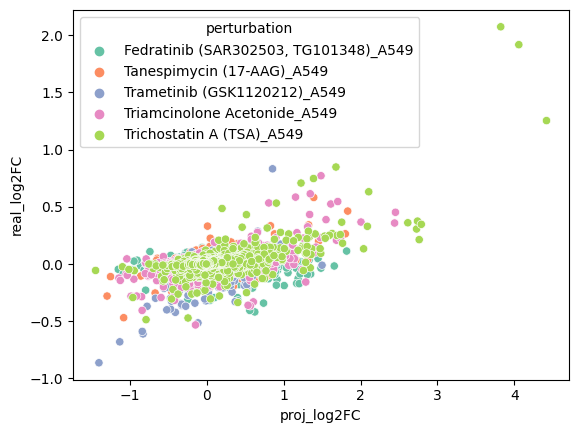

In [92]:
sns.scatterplot(data=res1_log2fc_df, x="proj_log2FC", y="real_log2FC", hue="perturbation")


In [93]:
res_all

,log2FC,source,Y_max,perturbation
0,4,proj,K562,"Fedratinib (SAR302503, TG101348)_A549"
1,0,real,K562,"Fedratinib (SAR302503, TG101348)_A549"
0,0,proj,MCF7,"Fedratinib (SAR302503, TG101348)_A549"
1,0,real,MCF7,"Fedratinib (SAR302503, TG101348)_A549"
0,734,proj,K562,Tanespimycin (17-AAG)_A549
1,0,real,K562,Tanespimycin (17-AAG)_A549
0,0,proj,MCF7,Tanespimycin (17-AAG)_A549
1,1,real,MCF7,Tanespimycin (17-AAG)_A549
0,0,proj,K562,Trametinib (GSK1120212)_A549
1,0,real,K562,Trametinib (GSK1120212)_A549


In [94]:
log2fc_res_file = os.path.join(res_data_path, f"{res_id}_log2fc_null.csv")
res_all.to_csv(log2fc_res_file, index=False)

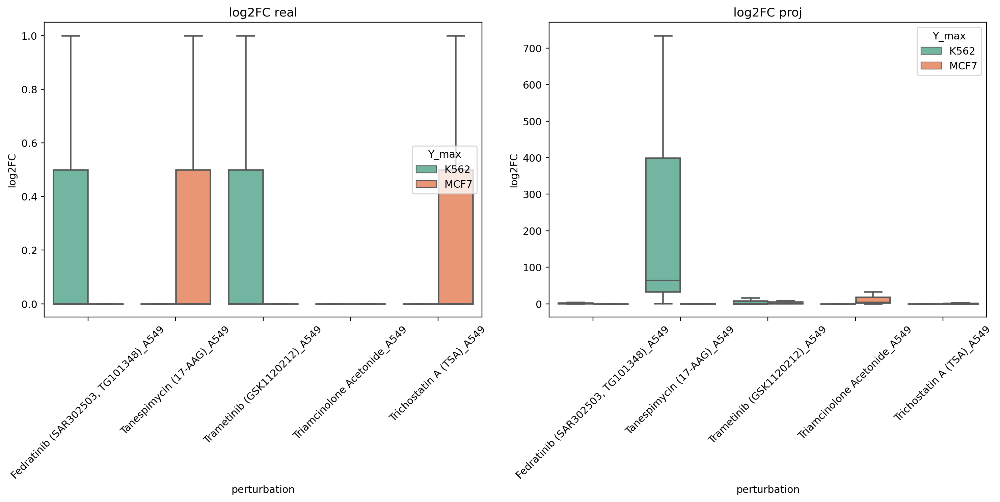

In [95]:

# plot
fig, axs = plt.subplots(1, 2, figsize=(14,7), dpi=216)

sns.boxplot(data=res_all.iloc[np.where(res_all.source == "real")[0]], 
            x="perturbation", y="log2FC",
            hue="Y_max", ax= axs[0])
axs[0].set_title("log2FC real")
axs[0].set(ylabel="log2FC")
axs[0].tick_params(axis='x', rotation=45)


sns.boxplot(data=res_all.iloc[np.where(res_all.source == "proj")[0]], 
            x="perturbation", y="log2FC",
            hue="Y_max", ax= axs[1])
axs[1].set_title("log2FC proj")
axs[1].set(ylabel="log2FC")
axs[1].tick_params(axis='x', rotation=45)


fig.show()
fig.tight_layout()



# Calculate PRAUC

In [96]:
from importlib import reload  # Python 3.4+
reload(buddi)
reload(buddi.buddi4)
reload(sc_preprocess)
reload(vp)

<module 'buddi.plotting.validation_plotting' from '/home/natalie/projects/checkouts/buddi/buddi/plotting/validation_plotting.py'>

In [97]:
from matplotlib_venn import venn3
from sklearn.metrics import PrecisionRecallDisplay, RocCurveDisplay, roc_curve, precision_recall_curve
from random import sample

sns.set_palette("Set2")

# get PR curve

def plot_PR_ROC(proj_ctrl, proj_stim, real_ctrl, real_stim, curr_cell_type, axs, union_genes, num_top=100):

    # this is for the "projected" expression
    # take the median for nomalization
    proj_ctrl = np.median(rankdata(proj_ctrl, axis=1), axis=0)
    proj_stim = np.median(rankdata(proj_stim, axis=1), axis=0)
    proj_log2FC = abs(proj_stim-proj_ctrl)


    real_stim = np.median(rankdata(real_stim, axis=1), axis=0)
    real_ctrl = np.median(rankdata(real_ctrl, axis=1), axis=0)
    real_log2FC = abs(real_stim-real_ctrl)


    # make dataframe of true/false positives
    proj_log2FC_df = pd.DataFrame({"proj_log2FC":proj_log2FC,
                                    "real_log2FC":real_log2FC}, index=union_genes)
    proj_log2FC_df["orig"] = proj_stim-proj_ctrl

    # make a random one
    temp_samp = sample(proj_log2FC_df["proj_log2FC"].tolist(), len(proj_log2FC_df["proj_log2FC"].tolist()))
    temp_samp = [int(a) for a in temp_samp]
    proj_log2FC_df["random"] = temp_samp


    proj_log2FC_df["top_DE"] = 0
    proj_log2FC_df = proj_log2FC_df.sort_values(["real_log2FC"], ascending=False)
    proj_log2FC_df.top_DE.iloc[range(0,num_top)] = 1




    # now do the single-cell cell type specific DE
    roc_display = RocCurveDisplay.from_predictions(proj_log2FC_df.top_DE, proj_log2FC_df["proj_log2FC"], name="BuDDI", ax=axs[0])
    pr_display = PrecisionRecallDisplay.from_predictions(proj_log2FC_df.top_DE, proj_log2FC_df["proj_log2FC"], name="BuDDI", ax=axs[1])


    roc_display = RocCurveDisplay.from_predictions(proj_log2FC_df.top_DE, proj_log2FC_df.random, name="random",ax= axs[0])
    pr_display = PrecisionRecallDisplay.from_predictions(proj_log2FC_df.top_DE, proj_log2FC_df.random, name="random", ax=axs[1])

    sc_avg_pr_BuDDI = average_precision_score(proj_log2FC_df.top_DE, proj_log2FC_df["proj_log2FC"])
    sc_avg_pr_random = average_precision_score(proj_log2FC_df.top_DE, proj_log2FC_df.random)

    res_df = pd.DataFrame([sc_avg_pr_BuDDI, sc_avg_pr_random])
    res_df.columns = ["scores"]
    res_df["metric"] = ["avg_pr"]*2
    res_df["cell_type"] = [curr_cell_type]*2
    res_df["ref_set"] = ["sc"]*2
    res_df["method"] = ["BuDDI", "random"]
    res_df["num_top"] = [num_top]*2

    return axs, proj_log2FC_df, res_df


### Plot PR curves

In [98]:
def get_PRAUC(curr_cell_type_perturbed,
                meta_df, X_full, Y_full,
                res2_enc_unlab, res2_dec, union_genes, scaler, num_top):
    
    curr_samp = "samp1"

    ct_perturbed_idx = np.where(meta_df["cell_type_perturbed"] == curr_cell_type_perturbed)[0]

    all_perts = meta_df.iloc[ct_perturbed_idx].perturbation.unique()
    all_perts = np.setdiff1d(all_perts, "control")

    all_Ymax = np.setdiff1d(meta_df.Y_max.unique(), curr_cell_type_perturbed)

    curr_cell_type = curr_cell_type_perturbed

    all_res_df = None

    for curr_drug in all_perts:

        print(f"{curr_drug} {curr_cell_type_perturbed}")

        drug_idx = np.where((meta_df["perturbation"] == curr_drug) | (meta_df["perturbation"] == "control"))[0]
        #ct_idx = np.where(meta_df["Y_max"] == curr_cell_type_perturbed)[0]

        curr_idx = np.intersect1d(drug_idx, ct_perturbed_idx)
        #curr_idx = np.intersect1d(curr_idx, ct_idx)


        res1_meta_df, res1_decoded_0_0, res1_decoded_0_1, res1_top_genes = buddi.calc_buddi_perturbation(
                                                                            meta_df.iloc[curr_idx], X_full[curr_idx], Y_full.iloc[curr_idx], 
                                                                            scaler, 
                                                                            res2_enc_unlab, res2_dec, batch_size=500, 
                                                                            genes_ordered=union_genes, 
                                                                            top_lim=10, use_buddi4=True)


        real_stim, real_ctrl, proj_stim, proj_ctrl = vp.subset_sample_celltype_perturbation(X_full[curr_idx], res1_decoded_0_0, 
                                                                                        res1_decoded_0_1, scaler, curr_samp, 
                                                                                        "cell_type_specific", 
                                                                                        meta_df.iloc[curr_idx], res1_meta_df,
                                                                                        curr_cell_type_perturbed)


        fig, axs = plt.subplots(1, 2, figsize=(12, 6))
        axs, proj_log2FC_df, res_df = plot_PR_ROC(proj_ctrl, proj_stim, real_ctrl, real_stim, curr_cell_type, axs, union_genes, num_top)
        res_df["perturbation"] = curr_drug
        all_res_df = pd.concat([all_res_df, res_df])

    return all_res_df


Fedratinib (SAR302503, TG101348)_A549 A549


/home/natalie/projects/checkouts/buddi/buddi/buddi.py:893: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.isTraining = "Test"
/home/natalie/projects/checkouts/buddi/buddi/buddi.py:894: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.cell_prop_type = "cell_type_specific"
/tmp/ipykernel_1238203/847008577.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/use

Tanespimycin (17-AAG)_A549 A549


/home/natalie/projects/checkouts/buddi/buddi/buddi.py:893: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.isTraining = "Test"
/home/natalie/projects/checkouts/buddi/buddi/buddi.py:894: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.cell_prop_type = "cell_type_specific"
/tmp/ipykernel_1238203/847008577.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/use

Trametinib (GSK1120212)_A549 A549


/home/natalie/projects/checkouts/buddi/buddi/buddi.py:893: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.isTraining = "Test"
/home/natalie/projects/checkouts/buddi/buddi/buddi.py:894: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.cell_prop_type = "cell_type_specific"
/tmp/ipykernel_1238203/847008577.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/use

Triamcinolone Acetonide_A549 A549


/home/natalie/projects/checkouts/buddi/buddi/buddi.py:893: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.isTraining = "Test"
/home/natalie/projects/checkouts/buddi/buddi/buddi.py:894: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.cell_prop_type = "cell_type_specific"
/tmp/ipykernel_1238203/847008577.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/use

Trichostatin A (TSA)_A549 A549


/home/natalie/projects/checkouts/buddi/buddi/buddi.py:893: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.isTraining = "Test"
/home/natalie/projects/checkouts/buddi/buddi/buddi.py:894: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.cell_prop_type = "cell_type_specific"
/tmp/ipykernel_1238203/847008577.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/use

Fedratinib (SAR302503, TG101348)_A549 A549


/home/natalie/projects/checkouts/buddi/buddi/buddi.py:893: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.isTraining = "Test"
/home/natalie/projects/checkouts/buddi/buddi/buddi.py:894: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.cell_prop_type = "cell_type_specific"
/tmp/ipykernel_1238203/847008577.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/use

Tanespimycin (17-AAG)_A549 A549


/home/natalie/projects/checkouts/buddi/buddi/buddi.py:893: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.isTraining = "Test"
/home/natalie/projects/checkouts/buddi/buddi/buddi.py:894: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.cell_prop_type = "cell_type_specific"
/tmp/ipykernel_1238203/847008577.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/use

Trametinib (GSK1120212)_A549 A549


/home/natalie/projects/checkouts/buddi/buddi/buddi.py:893: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.isTraining = "Test"
/home/natalie/projects/checkouts/buddi/buddi/buddi.py:894: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.cell_prop_type = "cell_type_specific"
/tmp/ipykernel_1238203/847008577.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/use

Triamcinolone Acetonide_A549 A549


/home/natalie/projects/checkouts/buddi/buddi/buddi.py:893: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.isTraining = "Test"
/home/natalie/projects/checkouts/buddi/buddi/buddi.py:894: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.cell_prop_type = "cell_type_specific"
/tmp/ipykernel_1238203/847008577.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/use

Trichostatin A (TSA)_A549 A549


/home/natalie/projects/checkouts/buddi/buddi/buddi.py:893: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.isTraining = "Test"
/home/natalie/projects/checkouts/buddi/buddi/buddi.py:894: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.cell_prop_type = "cell_type_specific"
/tmp/ipykernel_1238203/847008577.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/use

Fedratinib (SAR302503, TG101348)_A549 A549


/home/natalie/projects/checkouts/buddi/buddi/buddi.py:893: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.isTraining = "Test"
/home/natalie/projects/checkouts/buddi/buddi/buddi.py:894: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.cell_prop_type = "cell_type_specific"
/tmp/ipykernel_1238203/847008577.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/use

Tanespimycin (17-AAG)_A549 A549


/home/natalie/projects/checkouts/buddi/buddi/buddi.py:893: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.isTraining = "Test"
/home/natalie/projects/checkouts/buddi/buddi/buddi.py:894: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.cell_prop_type = "cell_type_specific"
/tmp/ipykernel_1238203/847008577.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/use

Trametinib (GSK1120212)_A549 A549


/home/natalie/projects/checkouts/buddi/buddi/buddi.py:893: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.isTraining = "Test"
/home/natalie/projects/checkouts/buddi/buddi/buddi.py:894: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.cell_prop_type = "cell_type_specific"
/tmp/ipykernel_1238203/847008577.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/use

Triamcinolone Acetonide_A549 A549


/home/natalie/projects/checkouts/buddi/buddi/buddi.py:893: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.isTraining = "Test"
/home/natalie/projects/checkouts/buddi/buddi/buddi.py:894: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.cell_prop_type = "cell_type_specific"
/tmp/ipykernel_1238203/847008577.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/use

Trichostatin A (TSA)_A549 A549


/home/natalie/projects/checkouts/buddi/buddi/buddi.py:893: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.isTraining = "Test"
/home/natalie/projects/checkouts/buddi/buddi/buddi.py:894: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.cell_prop_type = "cell_type_specific"
/tmp/ipykernel_1238203/847008577.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/use

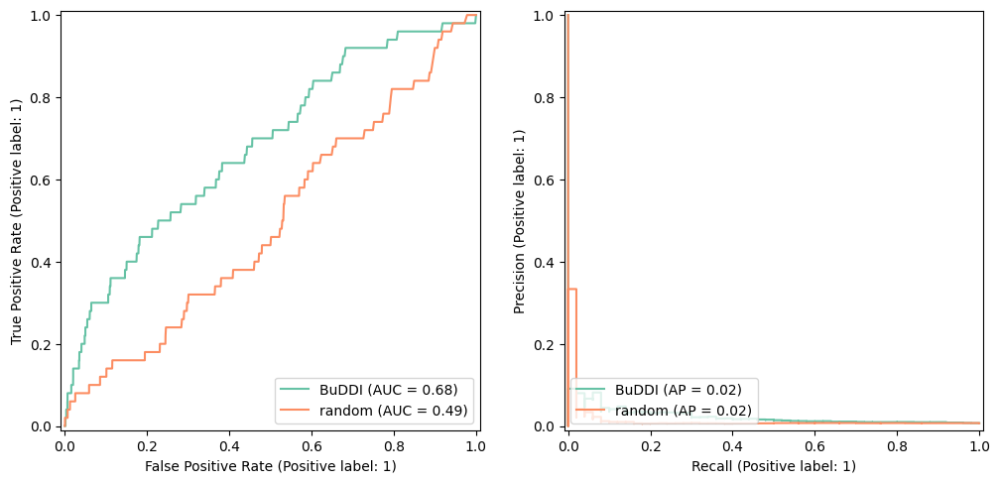

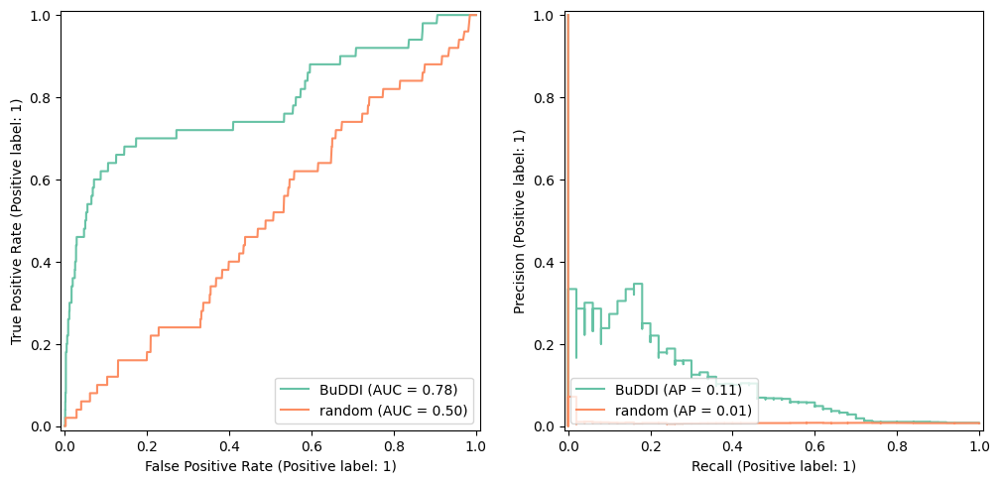

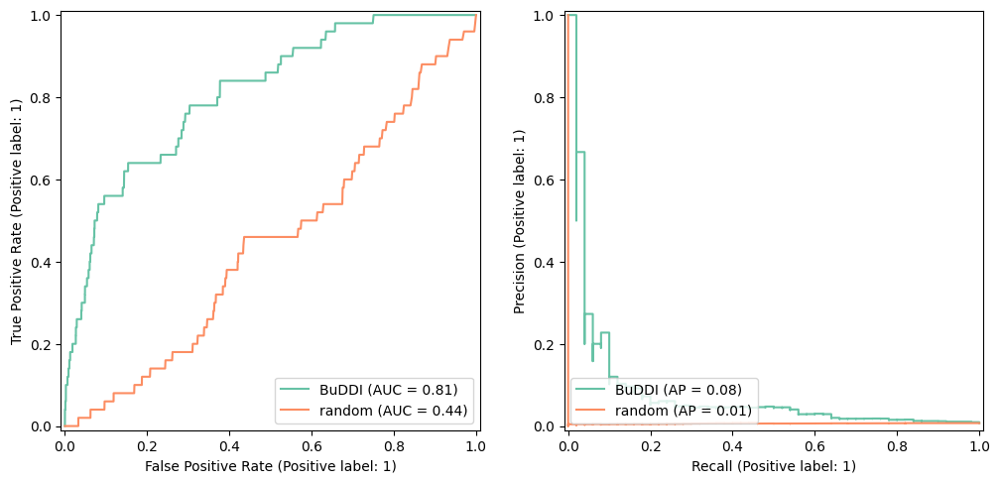

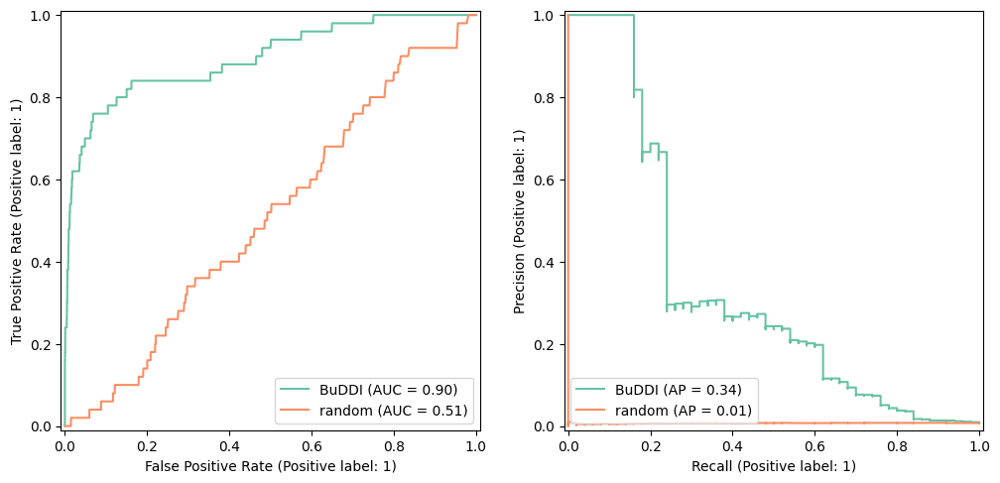

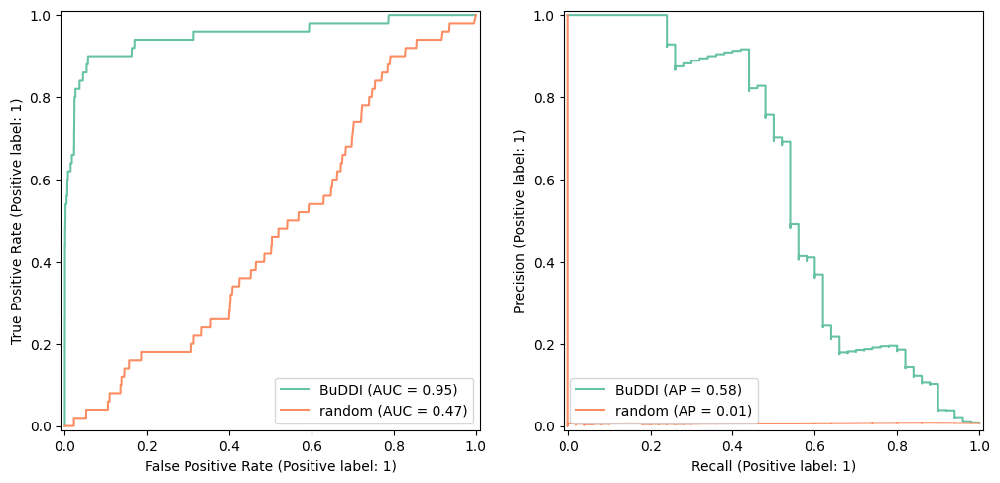

...

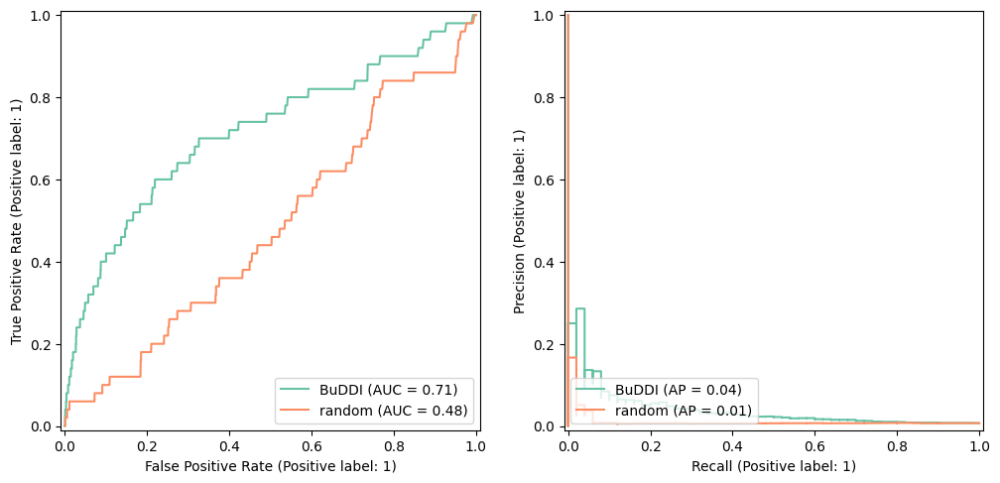

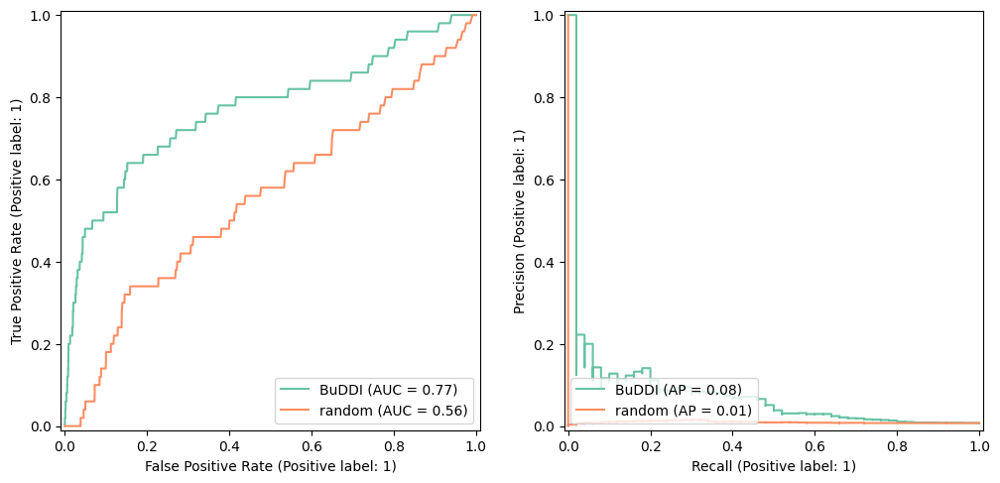

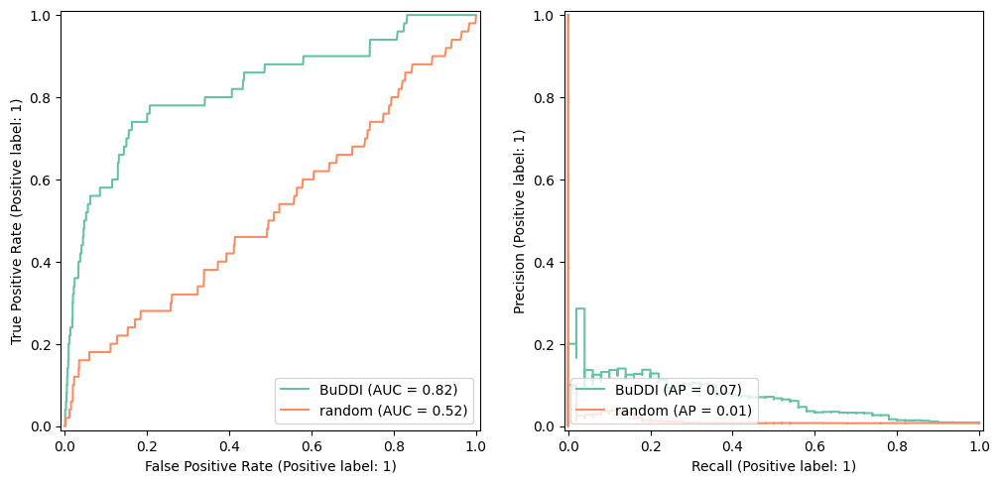

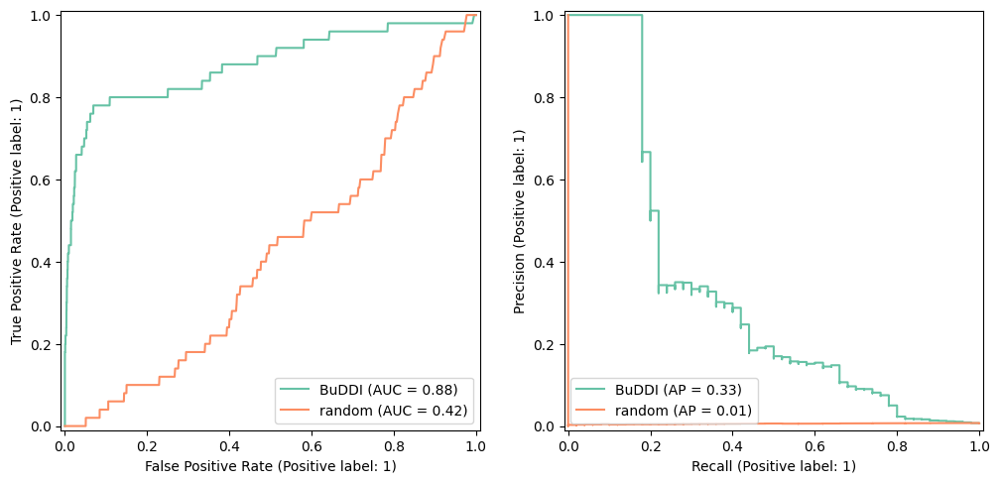

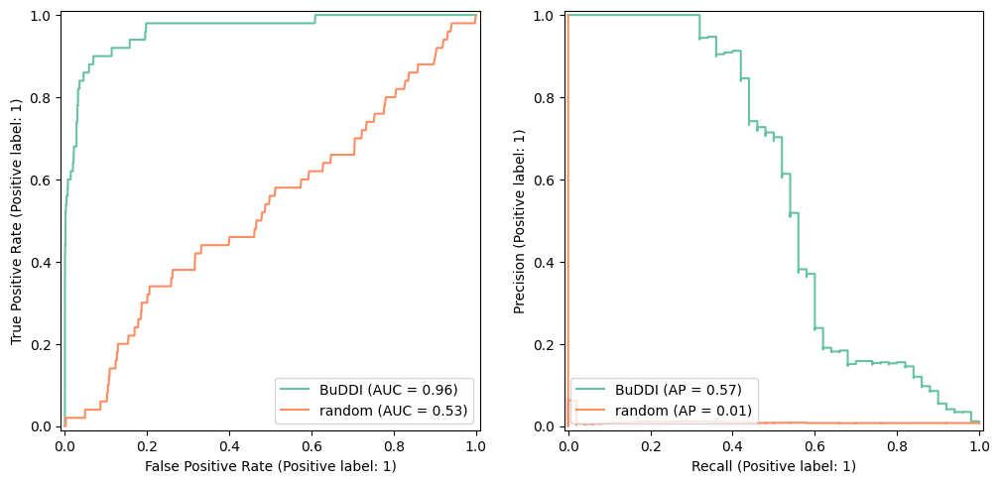

In [99]:
num_top = 50
pr_df1 = get_PRAUC(curr_treatment,
                    meta_df, X_full, Y_full,
                    res1_enc_unlab, res1_dec, union_genes, scaler, num_top)

pr_df2 = get_PRAUC(curr_treatment,
                    meta_df, X_full, Y_full,
                    res2_enc_unlab, res2_dec, union_genes, scaler, num_top)

pr_df3 = get_PRAUC(curr_treatment,
                    meta_df, X_full, Y_full,
                    res3_enc_unlab, res3_dec, union_genes, scaler, num_top)

pr_all = pd.concat([pr_df1, pr_df2, pr_df3])

prauc_res_file = os.path.join(res_data_path, f"{res_id}_{num_top}_prauc.csv")
pr_all.to_csv(prauc_res_file, index=False)

Fedratinib (SAR302503, TG101348)_A549 A549


/home/natalie/projects/checkouts/buddi/buddi/buddi.py:893: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.isTraining = "Test"
/home/natalie/projects/checkouts/buddi/buddi/buddi.py:894: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.cell_prop_type = "cell_type_specific"


/tmp/ipykernel_1238203/847008577.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.top_DE.iloc[range(0,num_top)] = 1


Tanespimycin (17-AAG)_A549 A549


/home/natalie/projects/checkouts/buddi/buddi/buddi.py:893: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.isTraining = "Test"
/home/natalie/projects/checkouts/buddi/buddi/buddi.py:894: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.cell_prop_type = "cell_type_specific"
/tmp/ipykernel_1238203/847008577.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/use

Trametinib (GSK1120212)_A549 A549


/home/natalie/projects/checkouts/buddi/buddi/buddi.py:893: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.isTraining = "Test"
/home/natalie/projects/checkouts/buddi/buddi/buddi.py:894: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.cell_prop_type = "cell_type_specific"
/tmp/ipykernel_1238203/847008577.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/use

Triamcinolone Acetonide_A549 A549


/home/natalie/projects/checkouts/buddi/buddi/buddi.py:893: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.isTraining = "Test"
/home/natalie/projects/checkouts/buddi/buddi/buddi.py:894: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.cell_prop_type = "cell_type_specific"
/tmp/ipykernel_1238203/847008577.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/use

Trichostatin A (TSA)_A549 A549


/home/natalie/projects/checkouts/buddi/buddi/buddi.py:893: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.isTraining = "Test"
/home/natalie/projects/checkouts/buddi/buddi/buddi.py:894: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.cell_prop_type = "cell_type_specific"
/tmp/ipykernel_1238203/847008577.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/use

Fedratinib (SAR302503, TG101348)_A549 A549


/home/natalie/projects/checkouts/buddi/buddi/buddi.py:893: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.isTraining = "Test"
/home/natalie/projects/checkouts/buddi/buddi/buddi.py:894: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.cell_prop_type = "cell_type_specific"
/tmp/ipykernel_1238203/847008577.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/use

Tanespimycin (17-AAG)_A549 A549


/home/natalie/projects/checkouts/buddi/buddi/buddi.py:893: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.isTraining = "Test"
/home/natalie/projects/checkouts/buddi/buddi/buddi.py:894: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.cell_prop_type = "cell_type_specific"
/tmp/ipykernel_1238203/847008577.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/use

Trametinib (GSK1120212)_A549 A549


/home/natalie/projects/checkouts/buddi/buddi/buddi.py:893: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.isTraining = "Test"
/home/natalie/projects/checkouts/buddi/buddi/buddi.py:894: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.cell_prop_type = "cell_type_specific"
/tmp/ipykernel_1238203/847008577.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/use

Triamcinolone Acetonide_A549 A549


/home/natalie/projects/checkouts/buddi/buddi/buddi.py:893: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.isTraining = "Test"
/home/natalie/projects/checkouts/buddi/buddi/buddi.py:894: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.cell_prop_type = "cell_type_specific"
/tmp/ipykernel_1238203/847008577.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/use

Trichostatin A (TSA)_A549 A549


/home/natalie/projects/checkouts/buddi/buddi/buddi.py:893: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.isTraining = "Test"
/home/natalie/projects/checkouts/buddi/buddi/buddi.py:894: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.cell_prop_type = "cell_type_specific"
/tmp/ipykernel_1238203/847008577.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/use

Fedratinib (SAR302503, TG101348)_A549 A549


/home/natalie/projects/checkouts/buddi/buddi/buddi.py:893: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.isTraining = "Test"
/home/natalie/projects/checkouts/buddi/buddi/buddi.py:894: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.cell_prop_type = "cell_type_specific"
/tmp/ipykernel_1238203/847008577.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/use

Tanespimycin (17-AAG)_A549 A549


/home/natalie/projects/checkouts/buddi/buddi/buddi.py:893: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.isTraining = "Test"
/home/natalie/projects/checkouts/buddi/buddi/buddi.py:894: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.cell_prop_type = "cell_type_specific"
/tmp/ipykernel_1238203/847008577.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/use

Trametinib (GSK1120212)_A549 A549


/home/natalie/projects/checkouts/buddi/buddi/buddi.py:893: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.isTraining = "Test"
/home/natalie/projects/checkouts/buddi/buddi/buddi.py:894: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.cell_prop_type = "cell_type_specific"
/tmp/ipykernel_1238203/847008577.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/use

Triamcinolone Acetonide_A549 A549


/home/natalie/projects/checkouts/buddi/buddi/buddi.py:893: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.isTraining = "Test"
/home/natalie/projects/checkouts/buddi/buddi/buddi.py:894: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.cell_prop_type = "cell_type_specific"
/tmp/ipykernel_1238203/847008577.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/use

Trichostatin A (TSA)_A549 A549


/home/natalie/projects/checkouts/buddi/buddi/buddi.py:893: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.isTraining = "Test"
/home/natalie/projects/checkouts/buddi/buddi/buddi.py:894: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.cell_prop_type = "cell_type_specific"
/tmp/ipykernel_1238203/847008577.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/use

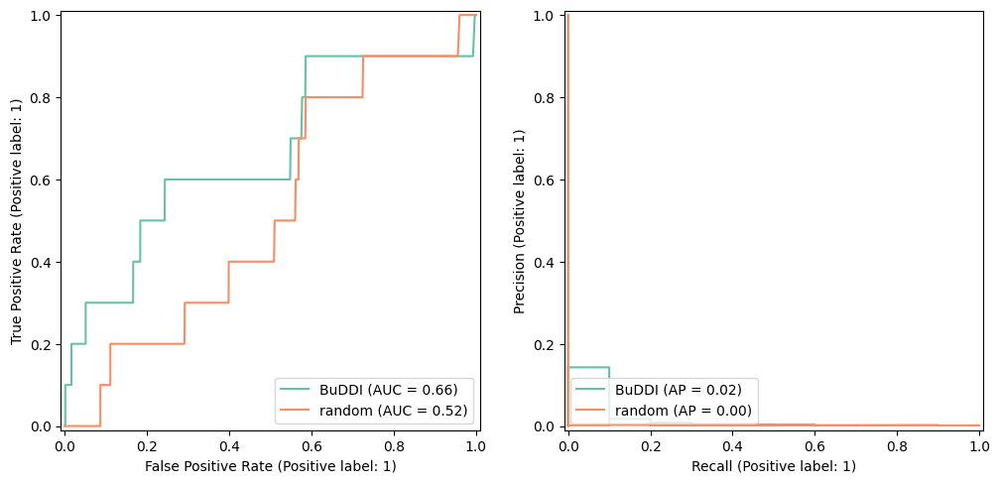

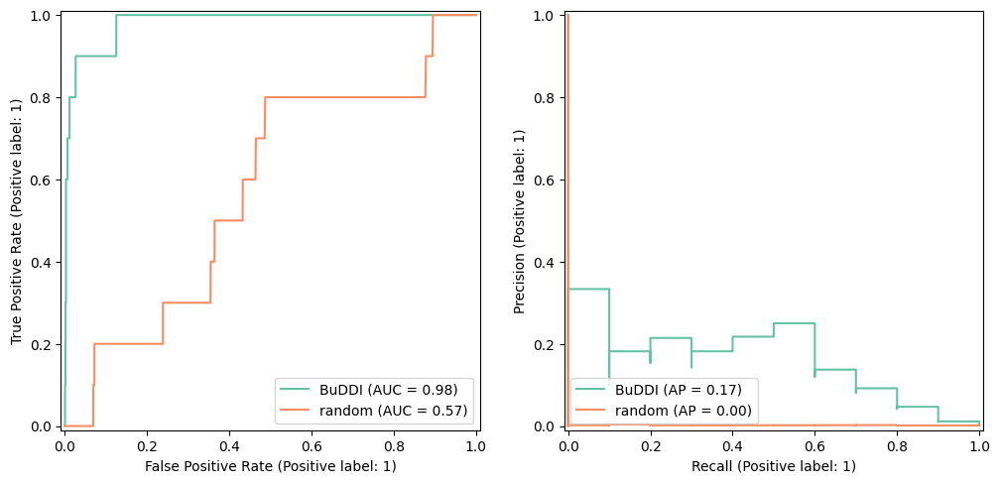

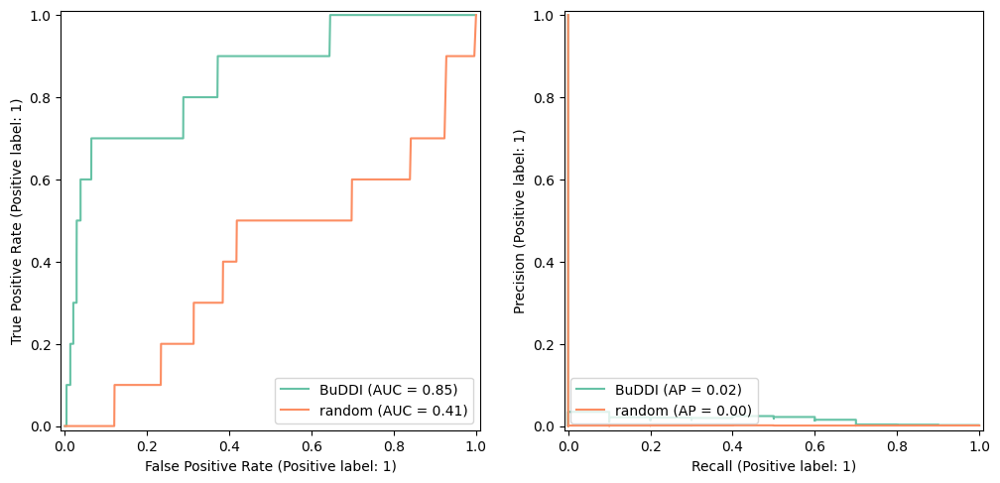

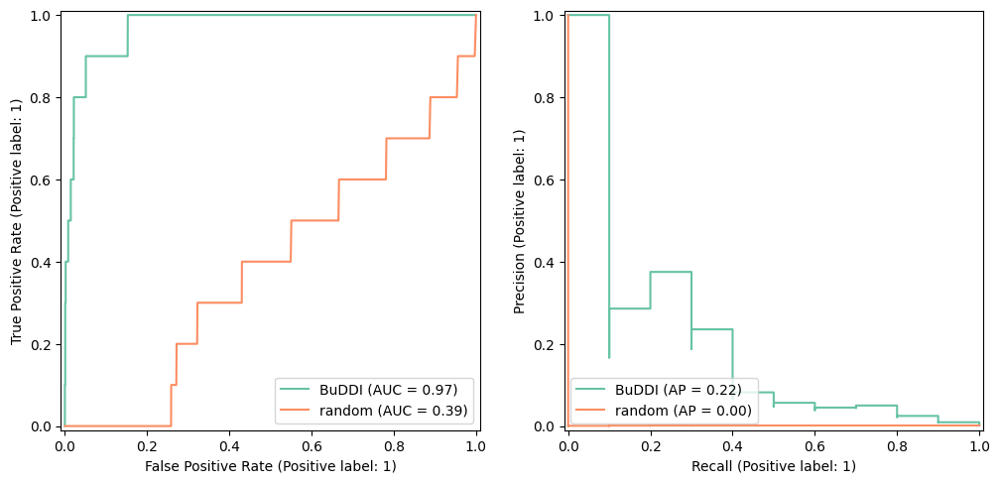

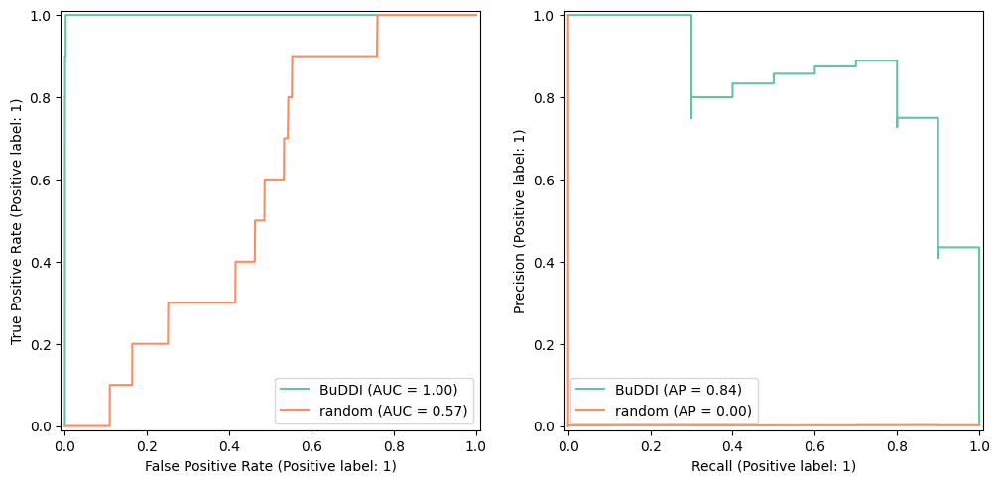

...

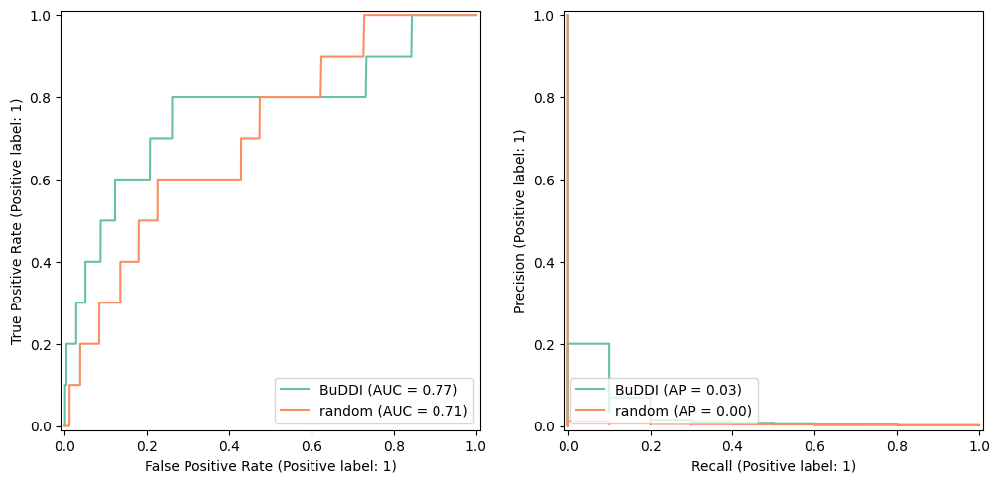

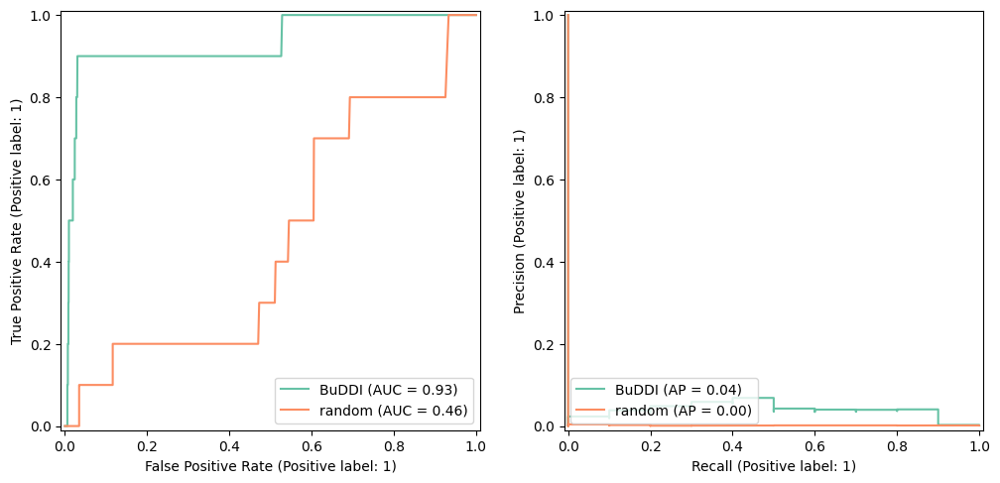

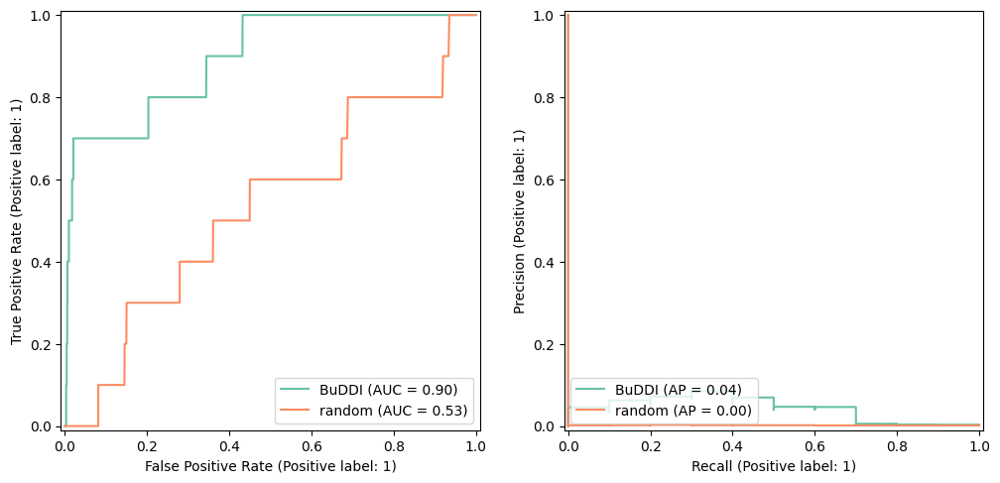

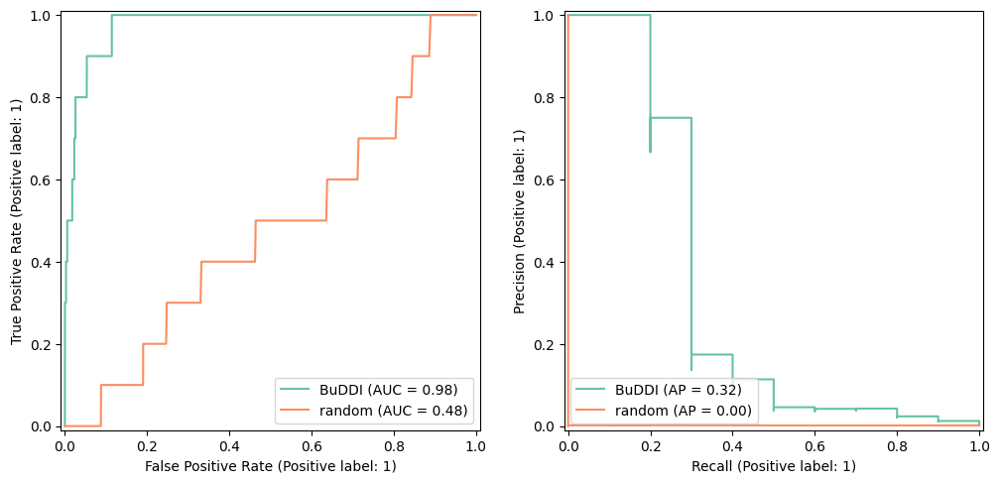

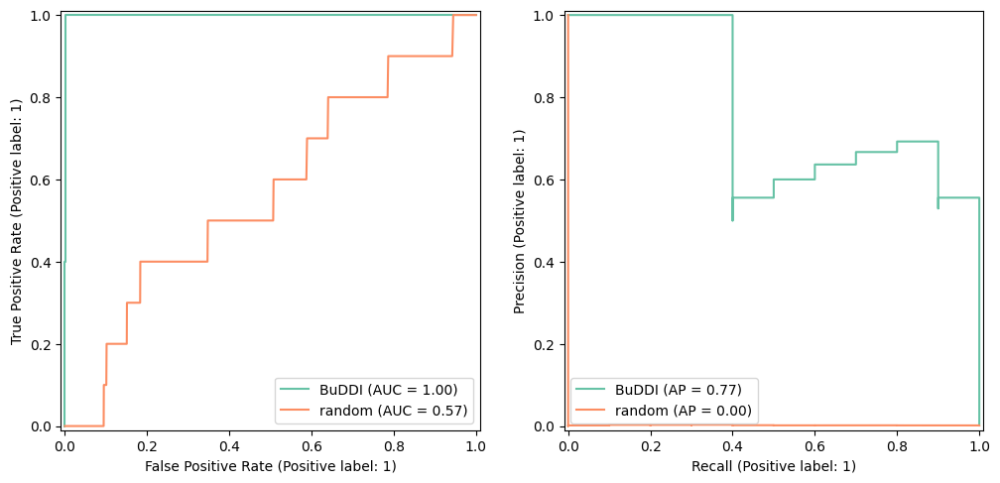

In [100]:
num_top = 10
pr_df1 = get_PRAUC(curr_treatment,
                    meta_df, X_full, Y_full,
                    res1_enc_unlab, res1_dec, union_genes, scaler, num_top)

pr_df2 = get_PRAUC(curr_treatment,
                    meta_df, X_full, Y_full,
                    res2_enc_unlab, res2_dec, union_genes, scaler, num_top)

pr_df3 = get_PRAUC(curr_treatment,
                    meta_df, X_full, Y_full,
                    res3_enc_unlab, res3_dec, union_genes, scaler, num_top)

pr_all = pd.concat([pr_df1, pr_df2, pr_df3])

prauc_res_file = os.path.join(res_data_path, f"{res_id}_{num_top}_prauc.csv")
pr_all.to_csv(prauc_res_file, index=False)

In [101]:
pr_all

,scores,metric,cell_type,ref_set,method,num_top,perturbation
0,0.018709,avg_pr,A549,sc,BuDDI,10,"Fedratinib (SAR302503, TG101348)_A549"
1,0.001703,avg_pr,A549,sc,random,10,"Fedratinib (SAR302503, TG101348)_A549"
0,0.166604,avg_pr,A549,sc,BuDDI,10,Tanespimycin (17-AAG)_A549
1,0.002094,avg_pr,A549,sc,random,10,Tanespimycin (17-AAG)_A549
0,0.016728,avg_pr,A549,sc,BuDDI,10,Trametinib (GSK1120212)_A549
1,0.001343,avg_pr,A549,sc,random,10,Trametinib (GSK1120212)_A549
0,0.216338,avg_pr,A549,sc,BuDDI,10,Triamcinolone Acetonide_A549
1,0.001218,avg_pr,A549,sc,random,10,Triamcinolone Acetonide_A549
0,0.843915,avg_pr,A549,sc,BuDDI,10,Trichostatin A (TSA)_A549
1,0.001762,avg_pr,A549,sc,random,10,Trichostatin A (TSA)_A549


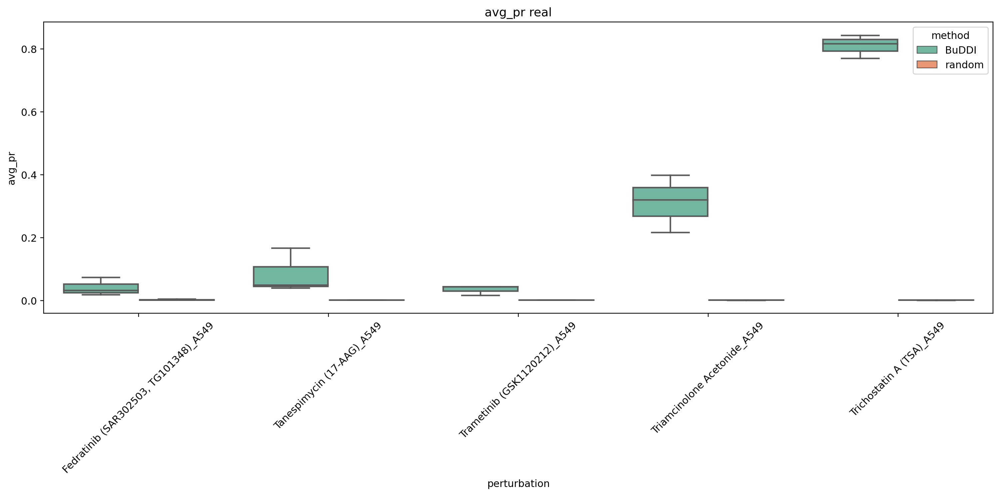

In [102]:

# plot
fig, axs = plt.subplots(1, 1, figsize=(14,7), dpi=216)

sns.boxplot(data=pr_all, 
            x="perturbation", y="scores",
            hue="method", ax= axs)
axs.set_title("avg_pr real")
axs.set(ylabel="avg_pr")
axs.tick_params(axis='x', rotation=45)


fig.show()
fig.tight_layout()

